<a href="https://colab.research.google.com/github/WillSAdkins/MSc_project_EEG/blob/main/Analysis_multimodal_hypothesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [4]:
from zipfile import ZipFile
import pandas as pd
from sklearn.model_selection import train_test_split
import string
import numpy as np
#!pip install tensorflow
#import tensorflow as tf
from sklearn.preprocessing import Normalizer
from sklearn.decomposition import PCA
# !pip install keras
from keras.models import Sequential,load_model
from keras.layers import Dense, Dropout, Conv2D, Flatten
from sklearn.metrics import accuracy_score, mean_squared_error
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from sklearn.preprocessing import OneHotEncoder
!pip install tqdm
from tqdm import tqdm
from sklearn.metrics import confusion_matrix
import seaborn as sns
import glob
#import cv2
import gc
!pip install mne
import mne
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
import time
import pickle
from mne.preprocessing import create_ecg_epochs
from scipy.interpolate import Rbf


def save_model_json(model, filename):
    # serialize model to JSON
    model_json = model.to_json()
    with open(f"{filename}.json", "w") as json_file:
        json_file.write(model_json)
    # serialize weights to HDF5
    model.save_weights(f"{filename}.h5")
    print(f"Saved {filename} to disk")



def load_model_json(filename):
    # load json and create model
    json_file = open(f'{filename}.json', 'r')
    loaded_model_json = json_file.read()
    json_file.close()
    loaded_model = model_from_json(loaded_model_json)
    # load weights into new model
    loaded_model.load_weights(f"{filename}.h5")
    print(f"Loaded {filename} from disk")
    return loaded_model

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Handle data

In [6]:
from warnings import resetwarnings
# Load the data in...
dir_path = "/content/drive/MyDrive/Bath/Dissertation/Analysis/Participants/"
participant = 'Will Adkins'
with ZipFile(dir_path + participant + '/' + 'recordings.zip', 'r') as zip_file:
    print(zip_file)
    print(zip_file.printdir())
    zip_file.extractall()

speaking1 = pd.read_csv('Labelled/speaking1_labelled.csv')
speaking2 = pd.read_csv('Labelled/speaking2_labelled.csv')
speaking3 = pd.read_csv('Labelled/speaking3_labelled.csv')
speaking4 = pd.read_csv('Labelled/speaking4_labelled.csv')
speaking5 = pd.read_csv('Labelled/speaking5_labelled.csv')
speaking6 = pd.read_csv('Labelled/speaking6_labelled.csv')
speaking7 = pd.read_csv('Labelled/speaking7_labelled.csv')
speaking8 = pd.read_csv('Labelled/speaking8_labelled.csv')
speaking9 = pd.read_csv('Labelled/speaking9_labelled.csv')
speaking10 = pd.read_csv('Labelled/speaking10_labelled.csv')
stimuli = pd.read_csv('Labelled/stimuli_labelled.csv')

<zipfile.ZipFile filename='/content/drive/MyDrive/Bath/Dissertation/Analysis/Participants/Will Adkins/recordings.zip' mode='r'>
File Name                                             Modified             Size
Labelled/speaking1_labelled.csv                2022-08-16 21:21:12     15114626
Labelled/speaking10_labelled.csv               2022-08-16 21:30:14     15179879
Labelled/speaking2_labelled.csv                2022-08-16 21:21:26     15110768
Labelled/speaking3_labelled.csv                2022-08-16 21:28:48     15115698
Labelled/speaking4_labelled.csv                2022-08-16 21:28:58     15114684
Labelled/speaking5_labelled.csv                2022-08-16 21:29:12     15115122
Labelled/speaking6_labelled.csv                2022-08-16 21:29:26     15114730
Labelled/speaking7_labelled.csv                2022-08-16 21:29:36     15113094
Labelled/speaking8_labelled.csv                2022-08-16 21:29:48     15111734
Labelled/speaking9_labelled.csv                2022-08-16 21:30:04     1

In [7]:
n_epochs = stimuli['Epoch'].iloc[-1] + 1 # Set the number of epochs as a variable for reference, and in the case we need to use it

In [8]:
# Create a speaking dataset that is the concatenation of each of the 10 speaking datasets for each repeat, whilst preserving order to the epochs...
speaking = pd.concat([speaking1, speaking2, speaking3, speaking4, speaking5, speaking6, speaking7, speaking8, speaking9, speaking10], axis = 0)

In [9]:
# it can be seen that one epoch of speaking data contains 512 recordings (256 recordings per second for 2 seconds) of 14 channels, 
# with the two reference channels included in the dataset aswell.
speaking[speaking['Epoch'] == 0]

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
0,23.000000,0,4111.538574,4232.948730,4218.717773,4237.948730,4243.717773,4230.641113,4230.384766,4173.077148,...,4207.692383,4225.000000,4238.461426,4236.410156,4243.077148,4103.846191,4229.871582,Lamp,audio,speaking1
1,23.003906,0,4226.025879,4236.538574,4243.589844,4228.717773,4232.436035,4200.512695,4238.077148,4205.897461,...,4233.974121,4237.563965,4242.692383,4101.282227,4230.384766,4238.717773,4239.487305,Lamp,audio,speaking1
2,23.007812,0,4247.948730,4230.897461,4240.128418,4240.256348,4238.846191,4207.692383,4222.307617,4234.487305,...,4245.769043,4104.487305,4235.512695,4251.410156,4246.282227,4255.256348,4236.794922,Lamp,audio,speaking1
3,23.011719,0,4249.743652,4271.282227,4243.974121,4212.436035,4227.051270,4239.871582,4248.333496,4251.025879,...,4243.077148,4258.846191,4253.974121,4262.051270,4243.461426,4256.025879,4276.922852,Lamp,audio,speaking1
4,23.015625,0,4251.922852,4218.461426,4234.871582,4247.307617,4252.948730,4256.282227,4117.820313,4248.974121,...,4258.205078,4265.128418,4246.922852,4255.897461,4254.487305,4259.358887,4224.102539,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
507,42.980469,0,4253.589844,4245.897461,4260.000000,4242.820313,4232.051270,4250.000000,4202.436035,4279.230957,...,4256.538574,4251.153809,4306.538574,4283.205078,4261.666504,4253.846191,4244.230957,Lamp,audio,speaking10
508,42.984375,0,4256.666504,4243.333496,4230.384766,4249.743652,4202.820313,4273.589844,4232.820313,4254.615234,...,4308.205078,4284.743652,4261.538574,4251.282227,4243.077148,4259.358887,4245.000000,Lamp,audio,speaking10
509,42.988281,0,4226.794922,4249.615234,4202.820313,4269.102539,4232.307617,4255.512695,4253.589844,4309.615234,...,4261.794922,4247.820313,4241.794922,4265.641113,4246.282227,4222.436035,4247.436035,Lamp,audio,speaking10
510,42.992188,0,4201.282227,4267.051270,4231.538574,4258.717773,4253.717773,4310.000000,4280.641113,4261.410156,...,4240.256348,4270.641113,4245.641113,4218.846191,4242.692383,4198.717773,4267.948730,Lamp,audio,speaking10


In [10]:
# Speaking dataset contains 10 2 second windows per epoch for 130 epochs, with 512 time points with 14 channels per time point plus other info. 
# Leading to 665600 time recordings/samples/exanplars with 14 features
# (For those datasets that are complete !)
speaking

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
0,23.000000,0,4111.538574,4232.948730,4218.717773,4237.948730,4243.717773,4230.641113,4230.384766,4173.077148,...,4207.692383,4225.000000,4238.461426,4236.410156,4243.077148,4103.846191,4229.871582,Lamp,audio,speaking1
1,23.003906,0,4226.025879,4236.538574,4243.589844,4228.717773,4232.436035,4200.512695,4238.077148,4205.897461,...,4233.974121,4237.563965,4242.692383,4101.282227,4230.384766,4238.717773,4239.487305,Lamp,audio,speaking1
2,23.007812,0,4247.948730,4230.897461,4240.128418,4240.256348,4238.846191,4207.692383,4222.307617,4234.487305,...,4245.769043,4104.487305,4235.512695,4251.410156,4246.282227,4255.256348,4236.794922,Lamp,audio,speaking1
3,23.011719,0,4249.743652,4271.282227,4243.974121,4212.436035,4227.051270,4239.871582,4248.333496,4251.025879,...,4243.077148,4258.846191,4253.974121,4262.051270,4243.461426,4256.025879,4276.922852,Lamp,audio,speaking1
4,23.015625,0,4251.922852,4218.461426,4234.871582,4247.307617,4252.948730,4256.282227,4117.820313,4248.974121,...,4258.205078,4265.128418,4246.922852,4255.897461,4254.487305,4259.358887,4224.102539,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66555,4503.980469,129,4298.077148,4299.871582,4241.410156,4241.794922,4231.922852,4237.563965,4242.563965,4256.410156,...,4245.512695,4339.615234,4260.128418,4226.025879,4289.615234,4300.897461,4301.794922,Clock,text,speaking10
66556,4503.984375,129,4243.717773,4242.051270,4232.179688,4238.589844,4242.948730,4256.794922,4218.589844,4244.358887,...,4254.487305,4225.384766,4285.128418,4298.717773,4300.641113,4244.358887,4240.897461,Clock,text,speaking10
66557,4503.988281,129,4232.307617,4238.333496,4238.077148,4255.384766,4217.948730,4242.692383,4334.743652,4249.615234,...,4277.692383,4293.717773,4297.948730,4243.846191,4239.743652,4232.820313,4237.563965,Clock,text,speaking10
66558,4503.992188,129,4230.769043,4254.230957,4218.461426,4243.205078,4332.563965,4244.230957,4218.589844,4271.922852,...,4296.153809,4242.563965,4239.743652,4233.461426,4236.922852,4225.512695,4255.384766,Clock,text,speaking10


In [11]:
def Handle(dataframe):
    
    features = dataframe.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Label', 'Mode of Stimulus']).to_numpy().reshape(dataframe.shape[0] // (512), 512 * 14)
    targets = dataframe['Label'].to_numpy().reshape(dataframe.shape[0] // (512), 512)[:, 0]
    modes_of_stimuli = dataframe['Mode of Stimulus'].to_numpy().reshape(dataframe.shape[0] // (512), 512)[:, 0]
    return features, targets, modes_of_stimuli
features, targets, modes_of_stimuli = Handle(speaking)
stimuli_features, stimuli_targets, modes_of_stimuli_stimstage = Handle(stimuli)
pd.DataFrame(features)

,0,1,2,3,4,5,6,7,8,9,...,7158,7159,7160,7161,7162,7163,7164,7165,7166,7167
0,4111.538574,4232.948730,4218.717773,4237.948730,4243.717773,4230.641113,4230.384766,4173.077148,4241.153809,4207.692383,...,4267.307617,4206.538574,4266.410156,4250.128418,4261.794922,4243.846191,4225.897461,4225.897461,4313.333496,4267.820313
1,4236.410156,4217.563965,4231.538574,4260.128418,4134.615234,4234.615234,4211.538574,4221.025879,4248.846191,4264.743652,...,4268.974121,4247.051270,4242.307617,4177.820313,4133.974121,4197.179688,4285.384766,4223.717773,4187.051270,4246.538574
2,4175.769043,4139.487305,4504.871582,4074.743652,4119.358887,4188.974121,4196.410156,4090.769287,4056.410156,4183.846191,...,4061.923096,4431.538574,4273.974121,4289.487305,4293.205078,4302.563965,4366.666504,4295.769043,4259.102539,4215.769043
3,4204.230957,4197.948730,4208.461426,4174.230957,4182.948730,4203.333496,4201.794922,4598.589844,4220.384766,4232.307617,...,4205.512695,4314.743652,4266.153809,4261.922852,4255.512695,4262.307617,4260.512695,4258.846191,4248.205078,4150.128418
4,4251.538574,4295.769043,4109.615234,4358.589844,4182.179688,4241.153809,4217.179688,4272.692383,4322.051270,4294.615234,...,4218.589844,4220.512695,4221.538574,4231.025879,4202.820313,4185.512695,4199.487305,4131.538574,4191.025879,4257.692383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1295,4247.692383,4245.256348,4230.897461,4236.282227,4247.179688,4250.128418,4233.205078,4238.333496,4230.000000,4260.512695,...,4261.666504,4240.128418,4247.307617,4262.820313,4252.051270,4310.000000,4224.230957,4253.077148,4255.641113,4258.589844
1296,4254.230957,4288.205078,4251.794922,4255.128418,4247.692383,4248.589844,4261.153809,4255.641113,4249.743652,4243.589844,...,4226.922852,4227.307617,4230.769043,4237.051270,4244.743652,4228.077148,4227.436035,4242.179688,4233.461426,4276.666504
1297,4245.000000,4251.922852,4250.256348,4247.692383,4256.153809,4244.102539,4243.717773,4253.846191,4233.077148,4273.589844,...,4273.205078,4293.974121,4266.794922,4273.333496,4286.794922,4295.769043,4311.538574,4276.410156,4261.794922,4266.025879
1298,4307.820313,4242.948730,4238.333496,4246.282227,4220.769043,4244.871582,4230.256348,4240.256348,4231.666504,4216.282227,...,4262.051270,4259.230957,4239.487305,4257.563965,4294.871582,4282.051270,4246.794922,4234.871582,4279.358887,4270.641113


In [12]:
pd.DataFrame(modes_of_stimuli)

,0
0,audio
1,image
2,image
3,audio
4,text
...,...
1295,image
1296,audio
1297,None
1298,image


In [13]:
stimuli_targets

array(['Lamp', 'Ambulance', 'Ambulance', 'Clock', 'Ambulance',
       'Ambulance', 'Rest', 'Hospital', 'Lamp', 'Ambulance', 'Clock',
       'Ambulance', 'Ambulance', 'Lamp', 'Clock', 'Hospital', 'Rest',
       'Clock', 'Lamp', 'Hospital', 'Clock', 'Lamp', 'Lamp', 'Clock',
       'Clock', 'Lamp', 'Hospital', 'Rest', 'Clock', 'Clock', 'Clock',
       'Lamp', 'Hospital', 'Rest', 'Clock', 'Hospital', 'Ambulance',
       'Lamp', 'Hospital', 'Clock', 'Clock', 'Clock', 'Hospital', 'Lamp',
       'Hospital', 'Hospital', 'Ambulance', 'Rest', 'Clock', 'Ambulance',
       'Hospital', 'Hospital', 'Rest', 'Hospital', 'Hospital',
       'Ambulance', 'Lamp', 'Hospital', 'Clock', 'Hospital', 'Lamp',
       'Clock', 'Ambulance', 'Lamp', 'Hospital', 'Ambulance', 'Lamp',
       'Hospital', 'Clock', 'Hospital', 'Ambulance', 'Ambulance',
       'Ambulance', 'Ambulance', 'Ambulance', 'Lamp', 'Lamp', 'Ambulance',
       'Lamp', 'Hospital', 'Ambulance', 'Lamp', 'Ambulance', 'Clock',
       'Ambulance', 'Ambul

In [14]:
audio_ind = np.array(modes_of_stimuli) == 'audio'
audio_feat = features[audio_ind]
audio_targ = targets[audio_ind]

text_ind = np.array(modes_of_stimuli) == 'text'
text_feat = features[text_ind]
text_targ = targets[text_ind]

image_ind = np.array(modes_of_stimuli) == 'image'
image_feat = features[image_ind]
image_targ = targets[image_ind]

In [15]:
stimuli_audio_ind = np.array(modes_of_stimuli_stimstage) == 'audio'
stimuli_audio_feat = stimuli_features[stimuli_audio_ind]
stimuli_audio_targ = stimuli_targets[stimuli_audio_ind]

stimuli_text_ind = np.array(modes_of_stimuli_stimstage) == 'text'
stimuli_text_feat = stimuli_features[stimuli_text_ind]
stimuli_text_targ = stimuli_targets[stimuli_text_ind]

stimuli_image_ind = np.array(modes_of_stimuli_stimstage) == 'image'
stimuli_image_feat = stimuli_features[stimuli_image_ind]
stimuli_image_targ = stimuli_targets[stimuli_image_ind]

# Interpolation of frozen values

In [16]:
tester_array = speaking[['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']]
tester_array = tester_array.to_numpy()
tester_array[0, :] == tester_array[1, :]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False])

In [17]:
repeats_ind = []
non_repeats_ind = [0]
for i in range(1, speaking.shape[0]):
  if (tester_array[i-1, :] == tester_array[i, :]).all():
    repeats_ind.append(i)
  else:
    non_repeats_ind.append(i)

repeats_ind = np.array(repeats_ind, dtype = 'int')
non_repeats_ind = np.array(non_repeats_ind, dtype = 'int')
print(repeats_ind.shape, non_repeats_ind.shape, (repeats_ind.shape[0] + non_repeats_ind.shape[0] == speaking.shape[0]))
repeats_ind, non_repeats_ind

(87110,) (578490,) True


(array([    17,     18,     19, ..., 665575, 665576, 665577]),
 array([     0,      1,      2, ..., 665597, 665598, 665599]))

In [18]:
speaking.iloc[repeats_ind]

,Time:256Hz,Epoch,F3,FC5,AF3,F7,T7,P7,O1,O2,...,T8,F8,AF4,FC6,F4,Channel 15,Channel 16,Label,Mode of Stimulus,Stage
17,23.066406,0,4250.512695,4226.282227,4236.153809,4146.666504,4245.512695,4214.743652,4238.461426,4246.794922,...,4246.538574,4104.102539,4245.384766,4236.153809,4249.487305,4246.922852,4221.666504,Lamp,audio,speaking1
18,23.070312,0,4250.512695,4226.282227,4236.153809,4146.666504,4245.512695,4214.743652,4238.461426,4246.794922,...,4246.538574,4104.102539,4245.384766,4236.153809,4249.487305,4246.922852,4221.666504,Lamp,audio,speaking1
19,23.074219,0,4250.512695,4226.282227,4236.153809,4146.666504,4245.512695,4214.743652,4238.461426,4246.794922,...,4246.538574,4104.102539,4245.384766,4236.153809,4249.487305,4246.922852,4221.666504,Lamp,audio,speaking1
20,23.078125,0,4250.512695,4226.282227,4236.153809,4146.666504,4245.512695,4214.743652,4238.461426,4246.794922,...,4246.538574,4104.102539,4245.384766,4236.153809,4249.487305,4246.922852,4221.666504,Lamp,audio,speaking1
53,23.207031,0,4267.307617,4259.358887,4149.871582,4265.897461,4242.051270,4248.077148,4261.922852,4234.358887,...,4288.077148,4262.051270,4237.692383,4247.307617,4250.641113,4266.666504,4258.461426,Lamp,audio,speaking1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66501,4503.769531,129,4240.641113,4328.333496,4301.538574,4307.948730,4247.051270,4253.717773,4246.282227,4252.692383,...,4262.179688,4245.769043,4267.307617,4336.922852,4273.205078,4238.205078,4322.051270,Clock,text,speaking10
66534,4503.898438,129,4270.000000,4277.179688,4256.282227,4272.820313,4355.512695,4298.077148,4236.538574,4299.871582,...,4315.384766,4246.666504,4253.717773,4250.128418,4250.256348,4264.487305,4278.205078,Clock,text,speaking10
66535,4503.902344,129,4270.000000,4277.179688,4256.282227,4272.820313,4355.512695,4298.077148,4236.538574,4299.871582,...,4315.384766,4246.666504,4253.717773,4250.128418,4250.256348,4264.487305,4278.205078,Clock,text,speaking10
66536,4503.906250,129,4270.000000,4277.179688,4256.282227,4272.820313,4355.512695,4298.077148,4236.538574,4299.871582,...,4315.384766,4246.666504,4253.717773,4250.128418,4250.256348,4264.487305,4278.205078,Clock,text,speaking10


In [19]:
epoch_relative_indicies = pd.DataFrame((list(np.arange(1, 513)) * n_epochs * 10)[:speaking.shape[0]], columns = ['Time Index'])
print(len(epoch_relative_indicies), n_epochs)
pd.concat([speaking, epoch_relative_indicies])
speaking['Time Index'] = epoch_relative_indicies['Time Index']
non_repeats_data = speaking.iloc[non_repeats_ind].drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label'])
repeats_data = speaking.iloc[repeats_ind].drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label'])
non_repeats_data

665600 130


,F3,FC5,AF3,F7,T7,P7,O1,O2,P8,T8,F8,AF4,FC6,F4,Time Index
0,4111.538574,4232.948730,4218.717773,4237.948730,4243.717773,4230.641113,4230.384766,4173.077148,4241.153809,4207.692383,4225.000000,4238.461426,4236.410156,4243.077148,1
1,4226.025879,4236.538574,4243.589844,4228.717773,4232.436035,4200.512695,4238.077148,4205.897461,4221.922852,4233.974121,4237.563965,4242.692383,4101.282227,4230.384766,2
2,4247.948730,4230.897461,4240.128418,4240.256348,4238.846191,4207.692383,4222.307617,4234.487305,4242.307617,4245.769043,4104.487305,4235.512695,4251.410156,4246.282227,3
3,4249.743652,4271.282227,4243.974121,4212.436035,4227.051270,4239.871582,4248.333496,4251.025879,4111.153809,4243.077148,4258.846191,4253.974121,4262.051270,4243.461426,4
4,4251.922852,4218.461426,4234.871582,4247.307617,4252.948730,4256.282227,4117.820313,4248.974121,4259.102539,4258.205078,4265.128418,4246.922852,4255.897461,4254.487305,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66555,4298.077148,4299.871582,4241.410156,4241.794922,4231.922852,4237.563965,4242.563965,4256.410156,4218.333496,4245.512695,4339.615234,4260.128418,4226.025879,4289.615234,508
66556,4243.717773,4242.051270,4232.179688,4238.589844,4242.948730,4256.794922,4218.589844,4244.358887,4337.692383,4254.487305,4225.384766,4285.128418,4298.717773,4300.641113,509
66557,4232.307617,4238.333496,4238.077148,4255.384766,4217.948730,4242.692383,4334.743652,4249.615234,4222.307617,4277.692383,4293.717773,4297.948730,4243.846191,4239.743652,510
66558,4230.769043,4254.230957,4218.461426,4243.205078,4332.563965,4244.230957,4218.589844,4271.922852,4290.000000,4296.153809,4242.563965,4239.743652,4233.461426,4236.922852,511


In [20]:
repeats_data_values = repeats_data.drop(columns = ['Time Index']).to_numpy()
repeats_data_times = repeats_data['Time Index'].to_numpy()
non_repeats_data_values = non_repeats_data.drop(columns = ['Time Index']).to_numpy()
non_repeats_data_times = non_repeats_data['Time Index'].to_numpy()
repeats_data_values.shape, repeats_data_times.shape, non_repeats_data_values.shape, non_repeats_data_times.shape

((87110, 14), (87110,), (578490, 14), (578490,))

In [21]:
non_repeats_data_values

array([[4111.538574, 4232.94873 , 4218.717773, ..., 4238.461426,
        4236.410156, 4243.077148],
       [4226.025879, 4236.538574, 4243.589844, ..., 4242.692383,
        4101.282227, 4230.384766],
       [4247.94873 , 4230.897461, 4240.128418, ..., 4235.512695,
        4251.410156, 4246.282227],
       ...,
       [4232.307617, 4238.333496, 4238.077148, ..., 4297.94873 ,
        4243.846191, 4239.743652],
       [4230.769043, 4254.230957, 4218.461426, ..., 4239.743652,
        4233.461426, 4236.922852],
       [4221.794922, 4247.692383, 4332.563965, ..., 4236.794922,
        4225.128418, 4258.846191]])

In [22]:
# rng = np.random.default_rng()
# x, y, z,   d= rng.random((4, 50))
# print(x, '\n\n', d)
# rbfi = Rbf(x, d)  # radial basis function interpolator instance
# xi = np.linspace(0, 1, 20)
# di = rbfi(xi)   # interpolated values
# di.shape

# rbf_interpolator = Rbf(non_repeats_data_times[:10000], non_repeats_data_values[:10000], mode = 'N-D', function = 'gaussian')
# rbf_interpolator(repeats_data_times[:1000])


# MNE work (Preprocessing) montage

<DigMontage | 0 extras (headshape), 0 HPIs, 3 fiducials, 94 channels>
4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.


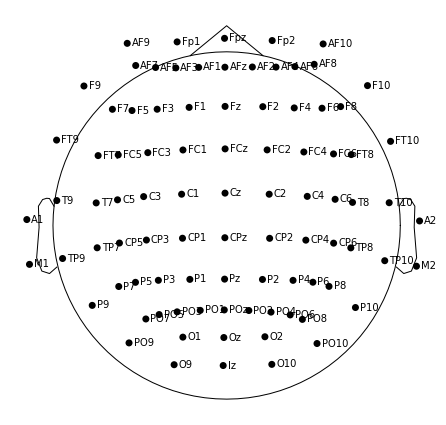

4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.


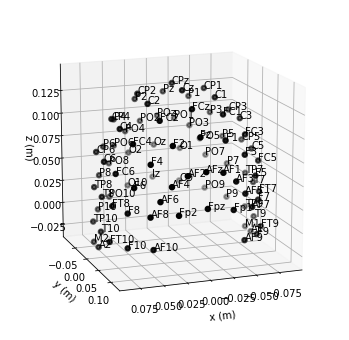

In [23]:
# Import the standard 10-20 montage for use in the mne data set. Code taken from online MNE tutorial
s1020 = mne.channels.make_standard_montage('standard_1020')
print(s1020)

s1020.plot()  # 2D
fig = s1020.plot(kind='3d', show=False)  # 3D
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial

{'F3': array([-0.04908182,  0.06114545,  0.04584545]), 'F4': array([0.04908182, 0.06114545, 0.04584545]), 'O1': array([-0.02809091, -0.08646364,  0.        ]), 'O2': array([ 0.02809091, -0.08646364,  0.        ]), 'F7': array([-0.07354545,  0.05343636,  0.        ]), 'F8': array([0.07354545, 0.05343636, 0.        ]), 'T7': array([-0.09090909,  0.        ,  0.        ]), 'T8': array([0.09090909, 0.        , 0.        ]), 'P7': array([-7.35454545e-02, -5.34363636e-02, -9.09090909e-06]), 'P8': array([ 7.35454545e-02, -5.34363636e-02, -9.09090909e-06]), 'FC5': array([-0.07917273,  0.03066364,  0.03226364]), 'FC6': array([0.07917273, 0.03066364, 0.03226364]), 'AF3': array([-0.03636364,  0.08181818,  0.03909091]), 'AF4': array([0.03636364, 0.08181818, 0.03909091])}


<ipython-input-24-a2732b1b990b>:9: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  montage.plot()


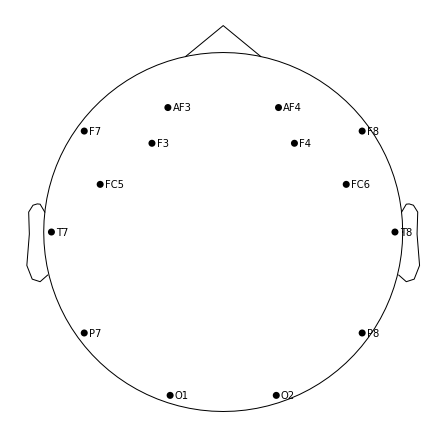

<ipython-input-24-a2732b1b990b>:10: RuntimeWarning: Fiducial point nasion not found, assuming identity unknown to head transformation
  fig = montage.plot(kind='3d', show=False)  # 3D


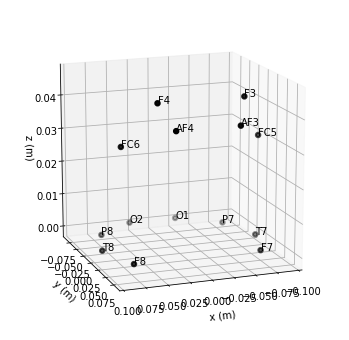

In [24]:
# Load in custom montage for visualisation purposes, not for use in datasets. Code taken from online MNE tutorial.
df = pd.read_csv('/content/drive/MyDrive/Bath/Dissertation/Analysis/channels_positional_Emotiv14.txt')
ch_names = df.name.to_list()

pos = df[['x','y','z']].values/11 # Scale down to size
dig_ch_pos = dict(zip(ch_names,pos))
print(dig_ch_pos)
montage = mne.channels.make_dig_montage(ch_pos=dig_ch_pos)
montage.plot()
fig = montage.plot(kind='3d', show=False)  # 3D
fig = fig.gca().view_init(azim=70, elev=15)  # set view angle for tutorial

# MNE work stimuli data

In [25]:
stimuli_mne = stimuli.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label']) # remove unwanted columns and keep channel data for loading into the mne dataset.

In [26]:
# Load data into mne RawArray format, with montage set to standard 10-20 system...

sfreq = 256
ch_names = list(stimuli_mne.columns)
print(ch_names)
info = mne.create_info(ch_names = ch_names, sfreq = sfreq, ch_types = 'eeg')
raw_stimuli = mne.io.RawArray(stimuli_mne[ch_names].transpose(), info)
raw_stimuli.set_montage(s1020)
raw_stimuli.info
#raw_stimuli.plot()
raw_stimuli

['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
Creating RawArray with float64 data, n_channels=14, n_times=66560
    Range : 0 ... 66559 =      0.000 ...   259.996 secs
Ready.


<RawArray | 14 x 66560 (260.0 s), ~7.1 MB, data loaded>

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


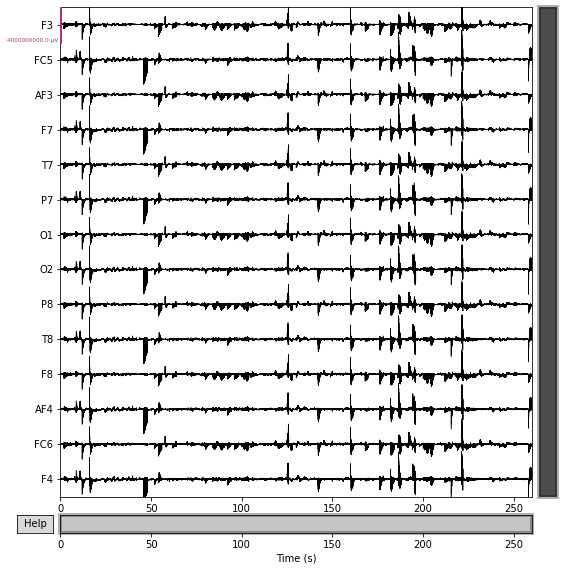

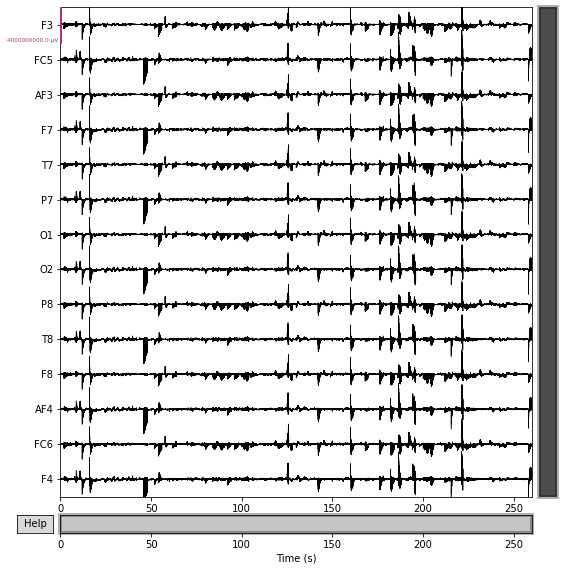

In [143]:
raw_stimuli.plot(duration = 3000, scalings = 2000)

In [27]:
# Create an events array and dictionary for the loading of the data into an mne Epochs format (In the case of the stimuli data)...

events_stimuli = mne.make_fixed_length_events(raw_stimuli, start=0, stop=4504, duration=2)
events_dict = {'Visual/Ambulance' : 1,
               'Visual/Hospital' : 2,
               'Visual/Clock' : 3,
               'Visual/Lamp' : 4,
               'Audio/Ambulance' : 5,
               'Audio/Hospital' : 6,
               'Audio/Clock' : 7,
               'Audio/Lamp' : 8,
               'Text/Ambulance' : 9,
               'Text/Hospital' : 10,
               'Text/Clock' : 11,
               'Text/Lamp' : 12,
               'None' : 13}

events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Hospital')), 2] = np.array([2 for i in range(((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Hospital')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Clock')), 2] = np.array([3 for i in range(((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Clock')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Lamp')), 2] = np.array([4 for i in range(((np.array(modes_of_stimuli_stimstage) == 'image')*(np.array(stimuli_targets) == 'Lamp')).sum())])

events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Ambulance')), 2] = np.array([5 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Ambulance')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Hospital')), 2] = np.array([6 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Hospital')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Clock')), 2] = np.array([7 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Clock')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Lamp')), 2] = np.array([8 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Lamp')).sum())])

events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Ambulance')), 2] = np.array([9 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Ambulance')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Hospital')), 2] = np.array([10 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Hospital')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Clock')), 2] = np.array([11 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Clock')).sum())])
events_stimuli[((np.array(modes_of_stimuli_stimstage) == 'text')*(np.array(stimuli_targets) == 'Lamp')), 2] = np.array([12 for i in range(((np.array(modes_of_stimuli_stimstage) == 'audio')*(np.array(stimuli_targets) == 'Lamp')).sum())])

events_stimuli[np.array(modes_of_stimuli_stimstage) == 'None', 2] = np.array([13 for i in range((np.array(modes_of_stimuli_stimstage) == 'None').sum())])


# events_stimuli.shape
# events_stimuli[np.array(modes_of_stimuli_stimstage) == 'audio', 2] = np.array([2 for i in range((np.array(modes_of_stimuli_stimstage) == 'audio').sum())])
# events_stimuli[np.array(modes_of_stimuli_stimstage) == 'text', 2] = np.array([3 for i in range((np.array(modes_of_stimuli_stimstage) == 'text').sum())])
# events_stimuli[np.array(modes_of_stimuli_stimstage) == 'None', 2] = np.array([4 for i in range((np.array(modes_of_stimuli_stimstage) == 'None').sum())])
for i in range(1, 14):
  print(f'Number of events with code {i} = ', (events_stimuli[:, 2] == i).sum())

Number of events with code 1 =  10
Number of events with code 2 =  10
Number of events with code 3 =  10
Number of events with code 4 =  10
Number of events with code 5 =  10
Number of events with code 6 =  10
Number of events with code 7 =  10
Number of events with code 8 =  10
Number of events with code 9 =  10
Number of events with code 10 =  10
Number of events with code 11 =  10
Number of events with code 12 =  10
Number of events with code 13 =  10


Not setting metadata
130 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 130 events and 513 original time points ...
1 bad epochs dropped


<ipython-input-130-ea4c0724b83c>:4: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  stimuli_epoched.plot(events = events_stimuli, n_epochs=10, scalings = 'auto')
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


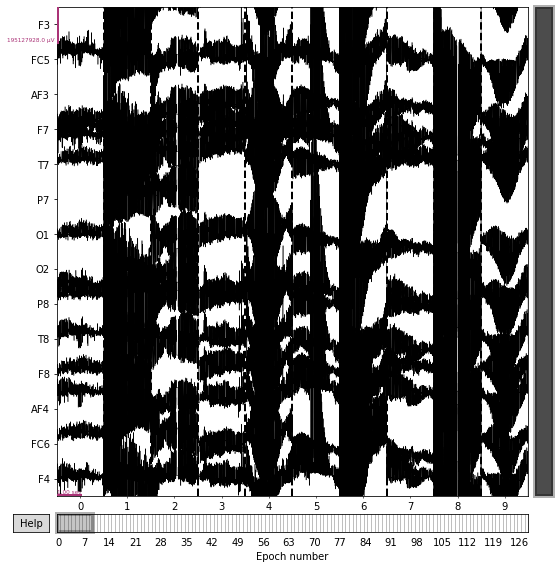

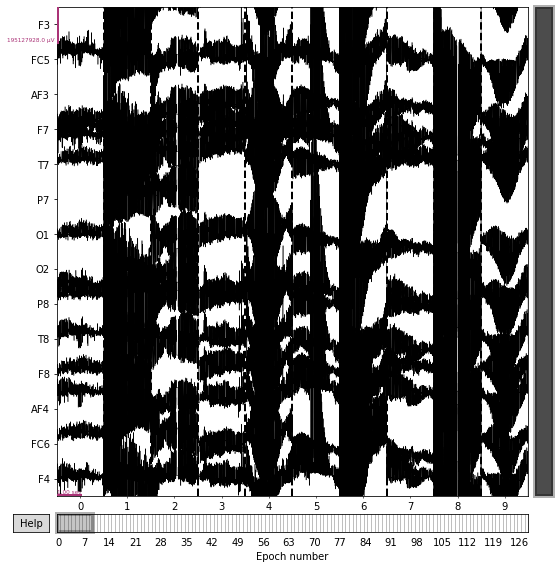

In [130]:
#Load the stimuli data into mne Epochs format...
reject_criteria = {'eeg' : 100000}
stimuli_epoched = mne.Epochs(raw_stimuli, tmin=0, tmax = 2, baseline=(0, 0), events = events_stimuli, event_id=events_dict, reject=reject_criteria, preload = True)
stimuli_epoched.plot(events = events_stimuli, n_epochs=10, scalings = 'auto')

In [29]:
# stimuli_epoched.plot_psd()
# stimuli_epoched_filt = stimuli_epoched.copy().filter(l_freq = 2, h_freq = None)

# stimuli_epoched_filt.plot_psd()
# stimuli_epoched = stimuli_epoched_filt.copy()

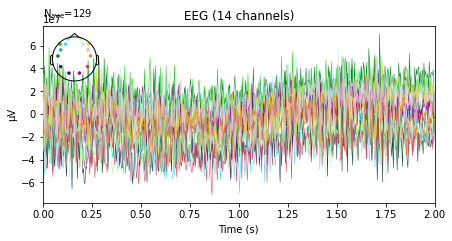

In [131]:
# Evoked response throughout all modes of stimuli...
ER_all = stimuli_epoched.average()
fig2 = ER_all.plot(spatial_colors=True)

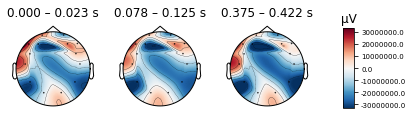

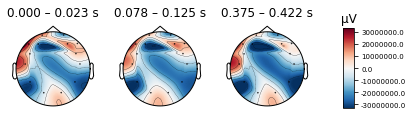

In [132]:
ER_all.plot_topomap(times=[0, 0.1, 0.4], average=0.05)

No projector specified for this dataset. Please consider the method self.add_proj.


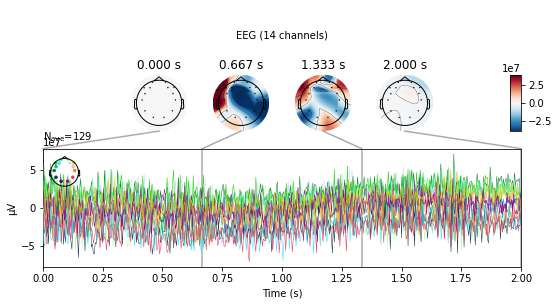

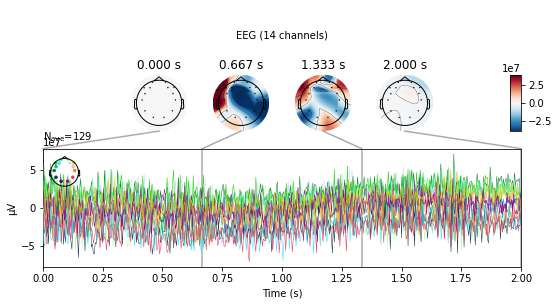

In [133]:
ER_all.plot_joint(times='auto')

In [134]:
# Find the average for each mode of stimuli...
# We could study the evoked response of each individual word - mode of stimulus pair, but that is beyond our scope
average_aud = stimuli_epoched['Audio'].average()
average_text = stimuli_epoched['Text'].average()
average_viz = stimuli_epoched['Visual'].average()


No projector specified for this dataset. Please consider the method self.add_proj.


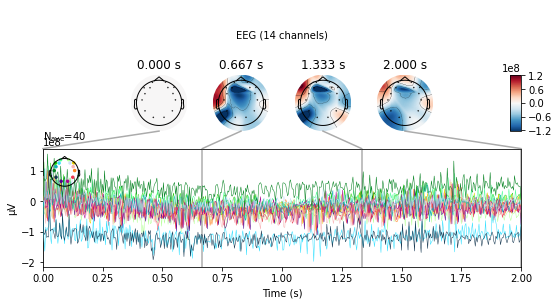

No projector specified for this dataset. Please consider the method self.add_proj.


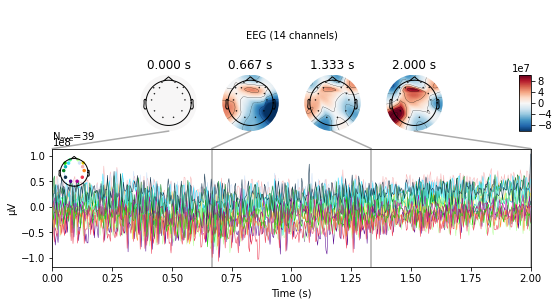

No projector specified for this dataset. Please consider the method self.add_proj.


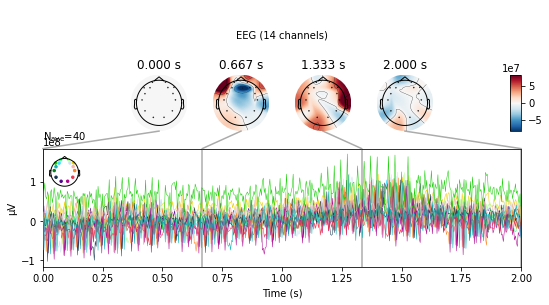

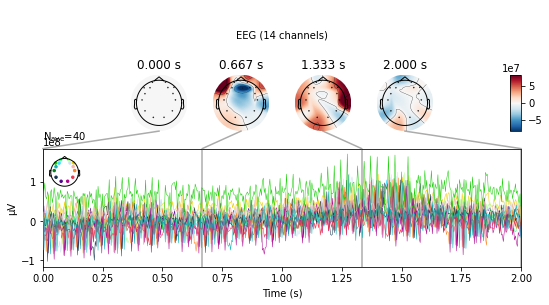

In [135]:
# Joint plot of average repsonse for 14 channels with topography overplot...
# For Audio, Visual, and text...
average_aud.plot_joint(times='auto')
average_text.plot_joint(times='auto')
average_viz.plot_joint(times='auto')

In [136]:
# Creation of independant lists for different brain regions of interest...
occipital = ['O1', 'O2']
temporal = ['T7', 'T8']
broca = ['F7']
ch_names


['F3',
 'FC5',
 'AF3',
 'F7',
 'T7',
 'P7',
 'O1',
 'O2',
 'P8',
 'T8',
 'F8',
 'AF4',
 'FC6',
 'F4']

More than 6 channels, truncating title ...
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


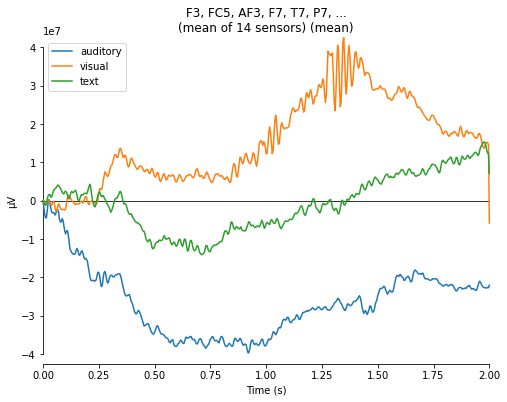

[<Figure size 576x432 with 1 Axes>]

In [137]:
# Plot of evoked responses for all channels averaged ...
evokeds = dict(auditory=average_aud, visual=average_viz, text=average_text)
picks = [ch_names[n] for n in range(0, 14)]
mne.viz.plot_compare_evokeds(evokeds, picks, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


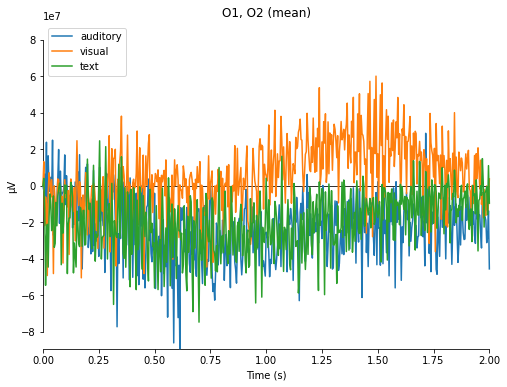

[<Figure size 576x432 with 1 Axes>]

In [138]:
# Plot of evoked responses for Occipital regions averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = occipital, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


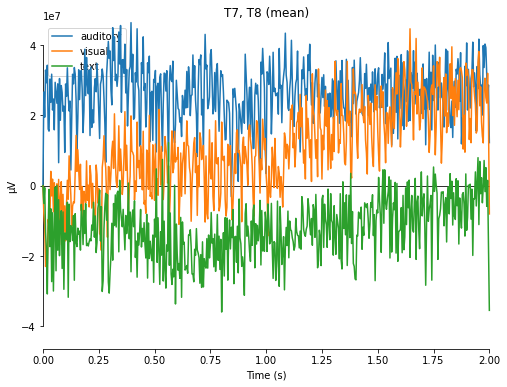

[<Figure size 576x432 with 1 Axes>]

In [38]:
# Plot of evoked responses for regions averaged...
mne.viz.plot_compare_evokeds(evokeds, picks = temporal, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


<ipython-input-39-2a2acca60a80>:2: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')


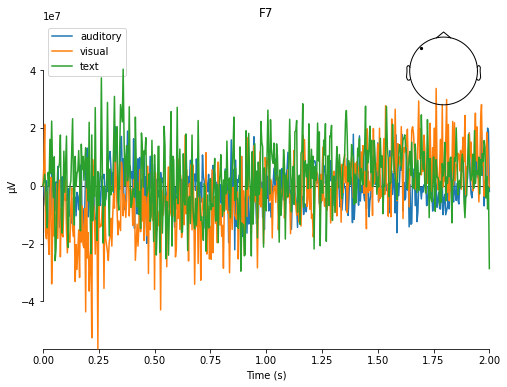

[<Figure size 576x432 with 2 Axes>]

In [39]:
# Plot of evoked responses for brocas area averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')

# MNE work speaking data

In [40]:
speaking_mne = speaking.drop(columns = ['Time:256Hz', 'Epoch', 'Stage', 'Channel 15', 'Channel 16', 'Mode of Stimulus', 'Label', 'Time Index'])  # remove unwanted columns and keep channel data for loading into the mne dataset.

In [41]:
# Load data into mne RawArray format, with montage set to standard 10-20 system...

sfreq = 256
ch_names = list(speaking_mne.columns)
print(ch_names)
info = mne.create_info(ch_names = ch_names, sfreq = sfreq, ch_types = 'eeg')
raw_speaking = mne.io.RawArray(speaking_mne[ch_names].transpose(), info)
raw_speaking.set_montage(s1020)
raw_speaking.info
#raw_stimuli.plot()
raw_speaking

['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
Creating RawArray with float64 data, n_channels=14, n_times=665600
    Range : 0 ... 665599 =      0.000 ...  2599.996 secs
Ready.


<RawArray | 14 x 665600 (2600.0 s), ~71.1 MB, data loaded>

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


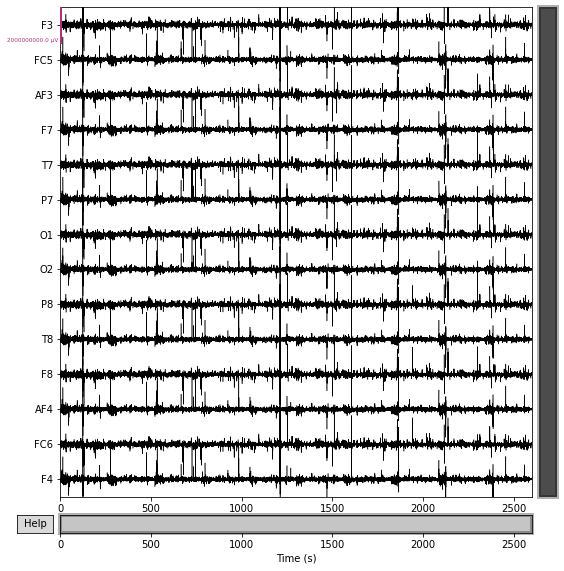

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


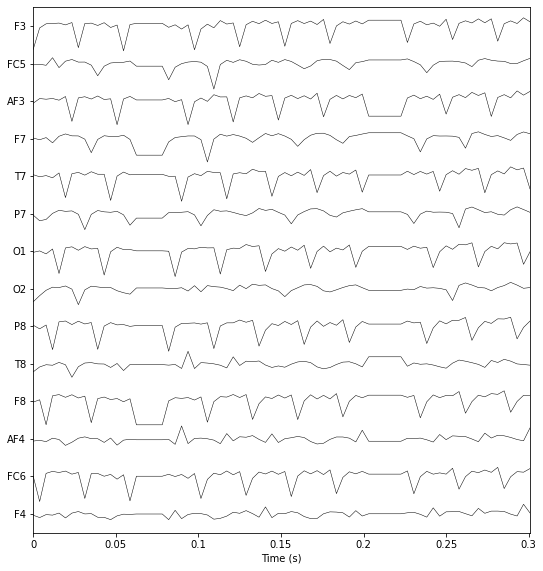

In [42]:
raw_speaking.plot(duration = 3000, scalings = 1000)

FVP = mne.viz.plot_raw(raw_speaking, duration = 0.3, scalings = 100, title='3 Seconds raw speaking data across all 14 channels', show_scrollbars=False, show_scalebars=False)

In [43]:
# Create an events array and dictionary for the loading of the data into an mne Epochs format (In the case of the speaking data)...

events_speaking = mne.make_fixed_length_events(raw_speaking, start=0, stop=4504, duration=2)

events_dict = {'Visual/Ambulance' : 1,
               'Visual/Hospital' : 2,
               'Visual/Clock' : 3,
               'Visual/Lamp' : 4,
               'Audio/Ambulance' : 5,
               'Audio/Hospital' : 6,
               'Audio/Clock' : 7,
               'Audio/Lamp' : 8,
               'Text/Ambulance' : 9,
               'Text/Hospital' : 10,
               'Text/Clock' : 11,
               'Text/Lamp' : 12,
               'None' : 13}

events_speaking[((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Hospital')), 2] = np.array([2 for i in range(((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Hospital')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Clock')), 2] = np.array([3 for i in range(((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Clock')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Lamp')), 2] = np.array([4 for i in range(((np.array(modes_of_stimuli) == 'image')*(np.array(targets) == 'Lamp')).sum())])

events_speaking[((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Ambulance')), 2] = np.array([5 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Ambulance')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Hospital')), 2] = np.array([6 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Hospital')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Clock')), 2] = np.array([7 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Clock')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Lamp')), 2] = np.array([8 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Lamp')).sum())])

events_speaking[((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Ambulance')), 2] = np.array([9 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Ambulance')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Hospital')), 2] = np.array([10 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Hospital')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Clock')), 2] = np.array([11 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Clock')).sum())])
events_speaking[((np.array(modes_of_stimuli) == 'text')*(np.array(targets) == 'Lamp')), 2] = np.array([12 for i in range(((np.array(modes_of_stimuli) == 'audio')*(np.array(targets) == 'Lamp')).sum())])

events_speaking[np.array(modes_of_stimuli) == 'None', 2] = np.array([13 for i in range((np.array(modes_of_stimuli) == 'None').sum())])


# events_stimuli.shape
# events_stimuli[np.array(modes_of_stimuli_stimstage) == 'audio', 2] = np.array([2 for i in range((np.array(modes_of_stimuli_stimstage) == 'audio').sum())])
# events_stimuli[np.array(modes_of_stimuli_stimstage) == 'text', 2] = np.array([3 for i in range((np.array(modes_of_stimuli_stimstage) == 'text').sum())])
# events_stimuli[np.array(modes_of_stimuli_stimstage) == 'None', 2] = np.array([4 for i in range((np.array(modes_of_stimuli_stimstage) == 'None').sum())])
for i in range(1, 14):
  print(f'Number of events with code {i} = ', (events_speaking[:, 2] == i).sum())


# events_dict = {'Visual' : 1,
#                'Audio' : 2,
#                'Text' : 3,
#                'None': 4}
# events_speaking.shape
# events_speaking[np.array(modes_of_stimuli) == 'audio', 2] = np.array([2 for i in range((np.array(modes_of_stimuli) == 'audio').sum())])
# events_speaking[np.array(modes_of_stimuli) == 'text', 2] = np.array([3 for i in range((np.array(modes_of_stimuli) == 'text').sum())])
# events_speaking[np.array(modes_of_stimuli) == 'None', 2] = np.array([4 for i in range((np.array(modes_of_stimuli) == 'None').sum())])
#events_stimuli[:50]


Number of events with code 1 =  100
Number of events with code 2 =  100
Number of events with code 3 =  100
Number of events with code 4 =  100
Number of events with code 5 =  100
Number of events with code 6 =  100
Number of events with code 7 =  100
Number of events with code 8 =  100
Number of events with code 9 =  100
Number of events with code 10 =  100
Number of events with code 11 =  100
Number of events with code 12 =  100
Number of events with code 13 =  100


Not setting metadata
1300 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 1300 events and 512 original time points ...
    Rejecting  epoch based on EEG : ['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
    Rejecting  epoch based on EEG : ['FC5', 'F7', 'P7', 'O2', 'T8', 'AF4', 'F4']
    Rejecting  epoch based on EEG : ['FC5', 'F7', 'P7', 'O2', 'T8', 'AF4', 'F4']
    Rejecting  epoch based on EEG : ['FC5', 'F7', 'P7', 'O2', 'T8', 'AF4', 'F4']
    Rejecting  epoch based on EEG : ['F3', 'AF3', 'T7', 'O1', 'P8', 'F8', 'FC6']
    Rejecting  epoch based on EEG : ['FC5', 'F7', 'P7', 'O2', 'T8', 'F4']
    Rejecting  epoch based on EEG : ['F3', 'FC5', 'AF3', 'F7', 'T7', 'P7', 'O1', 'O2', 'P8', 'T8', 'F8', 'AF4', 'FC6', 'F4']
    Rejecting  epoch based on EEG : ['FC6']
    Rejecting  epoch based on EEG : ['O1', 'P8', 'F8', 'FC6']
    Rejecting  epoch based on EEG : ['FC5', 'F7'

<ipython-input-44-01889d74aac7>:6: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  speaking_epoched.plot(events = events_speaking, n_epochs=40, scalings = 2000)
/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


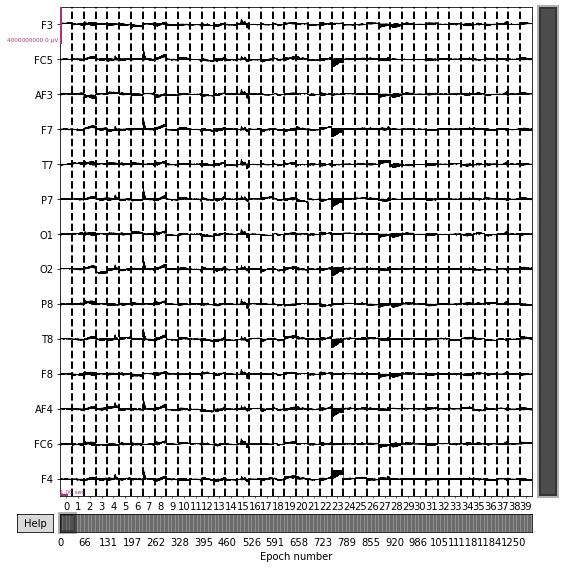

    Using multitaper spectrum estimation with 7 DPSS windows


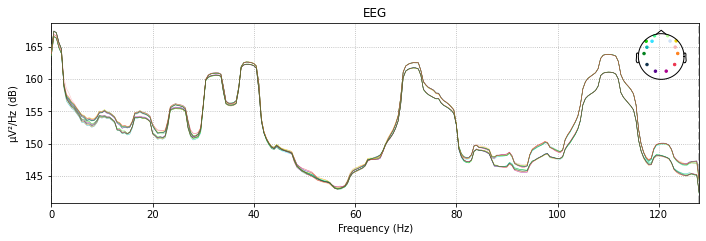

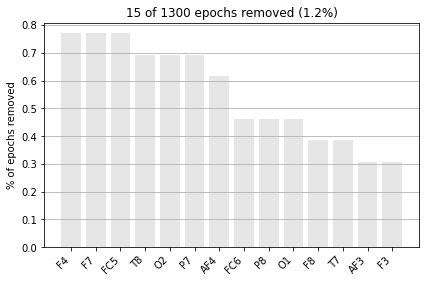

No projector specified for this dataset. Please consider the method self.add_proj.


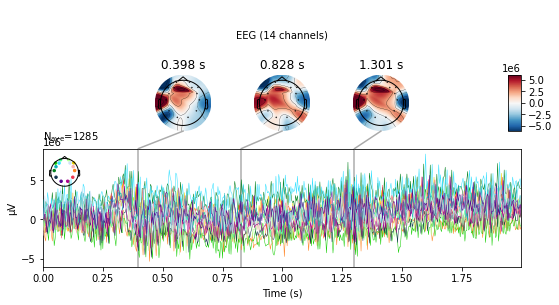

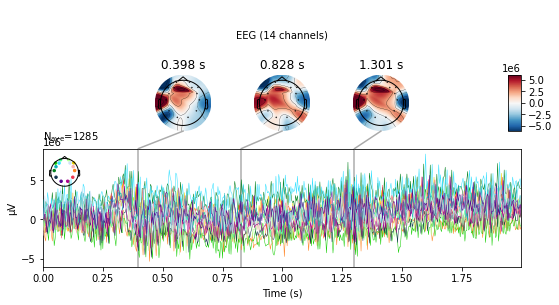

In [44]:
reject_criteria = {'eeg' : 2000}
speaking_epoched = mne.Epochs(raw_speaking, tmin=0, tmax = 2-1/256, baseline=(0, 0), events = events_speaking, event_id=events_dict,
                              reject=reject_criteria,
                              reject_by_annotation=False, preload = True)

speaking_epoched.plot(events = events_speaking, n_epochs=40, scalings = 2000)
speaking_epoched.plot_psd()
speaking_epoched.plot_drop_log()
speaking_epoched.average().plot_joint()

    Using multitaper spectrum estimation with 7 DPSS windows


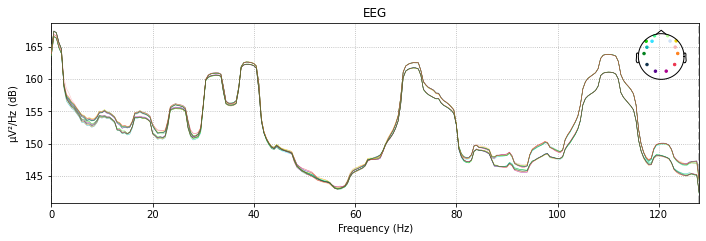

Setting up high-pass filter at 2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Filter length: 423 samples (1.652 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 17990 out of 17990 | elapsed:    5.3s finished


    Using multitaper spectrum estimation with 7 DPSS windows


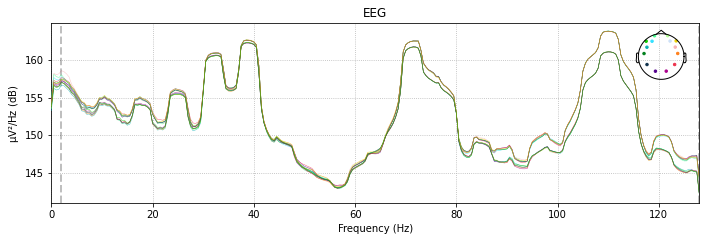

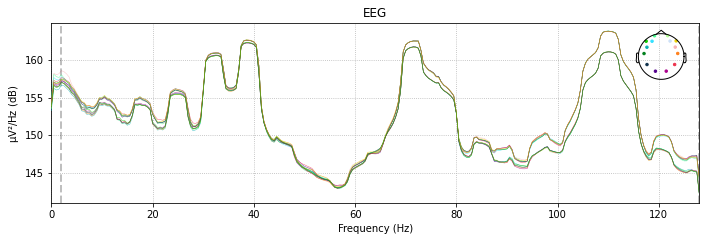

In [45]:
speaking_epoched.plot_psd()
speaking_epoched_filt = speaking_epoched.copy().filter(l_freq = 2, h_freq = None)
speaking_epoched_filt.plot_psd()

In [46]:
speaking_epoched_filt

Number of events,1285
Events,Audio/Ambulance: 98Audio/Clock: 100Audio/Hospital: 100Audio/Lamp: 98None: 98Text/Ambulance: 100Text/Clock: 100Text/Hospital: 98Text/Lamp: 100Visual/Ambulance: 100Visual/Clock: 100Visual/Hospital: 99Visual/Lamp: 94
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


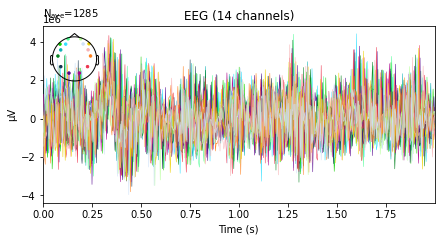

In [47]:
# Evoked response throughout all modes of stimuli...
ER_all_speaking = speaking_epoched_filt.average()
fig2 = ER_all_speaking.plot(spatial_colors=True)

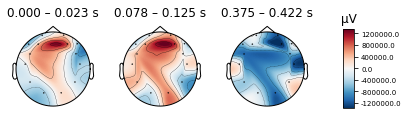

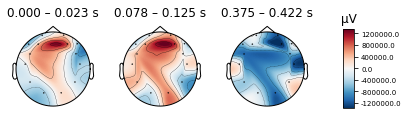

In [48]:
ER_all_speaking.plot_topomap(times=[0, 0.1, 0.4], average=0.05)

No projector specified for this dataset. Please consider the method self.add_proj.


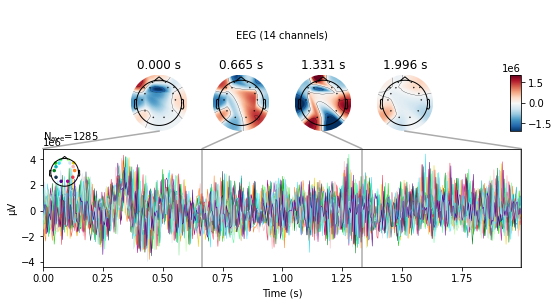

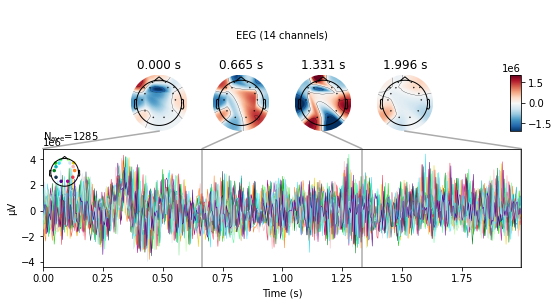

In [49]:
ER_all_speaking.plot_joint(times='auto')

In [50]:
# Find the average for each mode of stimuli...
average_aud = speaking_epoched_filt['Audio'].average()
average_text = speaking_epoched_filt['Text'].average()
average_viz = speaking_epoched_filt['Visual'].average()
average_hospital = speaking_epoched_filt['Hospital'].average()
average_ambulance = speaking_epoched_filt['Ambulance'].average()
average_clock = speaking_epoched_filt['Clock'].average()
average_lamp = speaking_epoched_filt['Lamp'].average()

average_aud_hospital = speaking_epoched_filt['Audio/Hospital'].average()
average_text_hospital = speaking_epoched_filt['Text/Hospital'].average()
average_viz_hospital = speaking_epoched_filt['Visual/Hospital'].average()
average_aud_ambulance = speaking_epoched_filt['Audio/Ambulance'].average()
average_text_ambulance = speaking_epoched_filt['Text/Ambulance'].average()
average_viz_ambulance = speaking_epoched_filt['Visual/Clock'].average()
average_aud_clock = speaking_epoched_filt['Audio/Clock'].average()
average_text_clock = speaking_epoched_filt['Text/Clock'].average()
average_viz_clock = speaking_epoched_filt['Visual/Clock'].average()
average_aud_lamp = speaking_epoched_filt['Audio/Lamp'].average()
average_text_lamp = speaking_epoched_filt['Text/Lamp'].average()
average_viz_lamp = speaking_epoched_filt['Visual/Lamp'].average()
average_rest = speaking_epoched_filt['None'].average()

No projector specified for this dataset. Please consider the method self.add_proj.


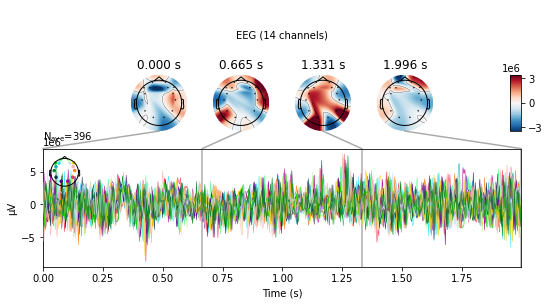

No projector specified for this dataset. Please consider the method self.add_proj.


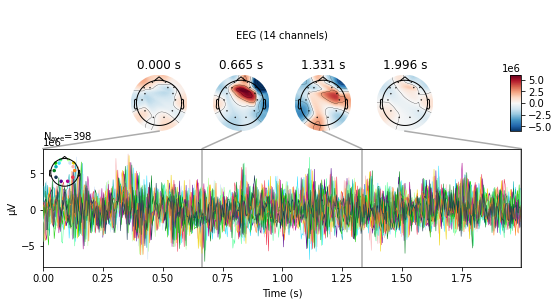

No projector specified for this dataset. Please consider the method self.add_proj.


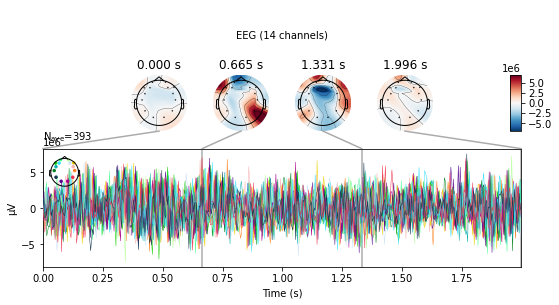

No projector specified for this dataset. Please consider the method self.add_proj.


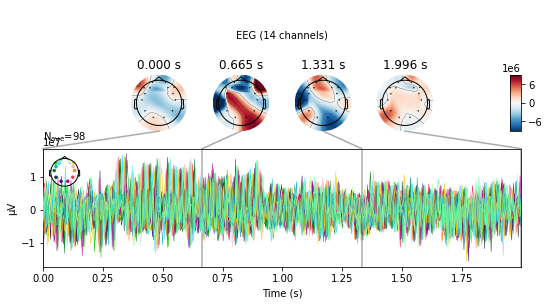

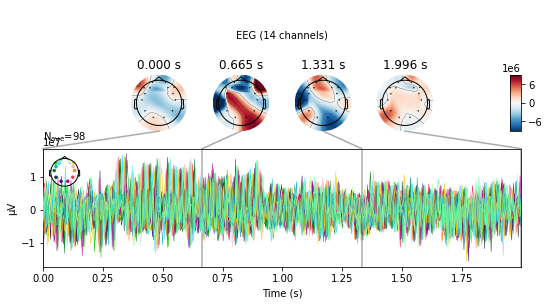

In [51]:
# Joint plot of average repsonse for 14 channels with topography overplot...
# For Audio, Visual, and text...
average_aud.plot_joint(times='auto')
average_text.plot_joint(times='auto')
average_viz.plot_joint(times='auto')
average_rest.plot_joint(times = 'auto')

In [52]:
# Creation of independant lists for different brain regions of interest...
occipital = ['O1', 'O2']
temporal = ['T7', 'T8']
broca = ['F7']
ch_names


['F3',
 'FC5',
 'AF3',
 'F7',
 'T7',
 'P7',
 'O1',
 'O2',
 'P8',
 'T8',
 'F8',
 'AF4',
 'FC6',
 'F4']

More than 6 channels, truncating title ...
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


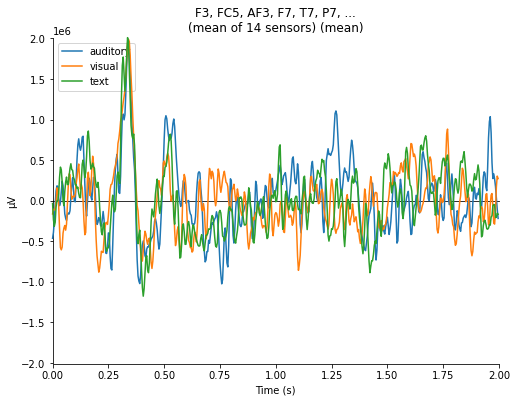

[<Figure size 576x432 with 1 Axes>]

In [129]:
# Plot of evoked responses for all channels averaged ...
evokeds = dict(auditory=average_aud, visual=average_viz, text=average_text)
picks = [ch_names[n] for n in range(0, 14)]
mne.viz.plot_compare_evokeds(evokeds, picks, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


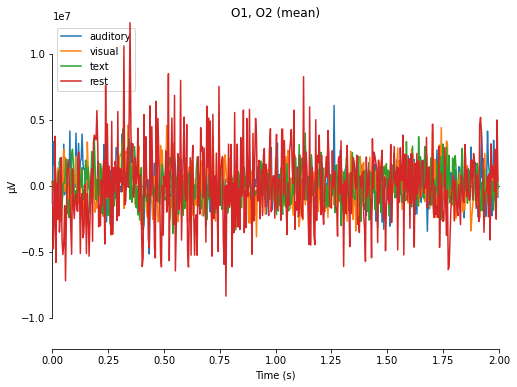

[<Figure size 576x432 with 1 Axes>]

In [54]:
# Plot of evoked responses for Occipital regions averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = occipital, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


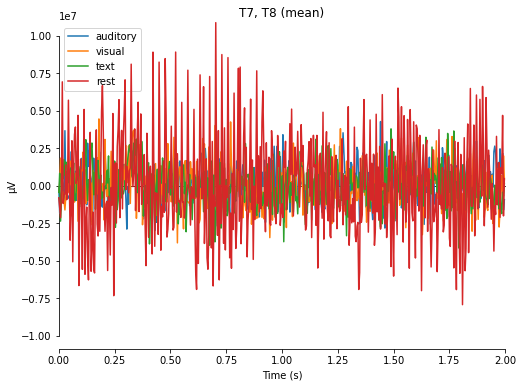

[<Figure size 576x432 with 1 Axes>]

In [55]:
# Plot of evoked responses for regions averaged...
mne.viz.plot_compare_evokeds(evokeds, picks = temporal, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


<ipython-input-56-2a2acca60a80>:2: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')


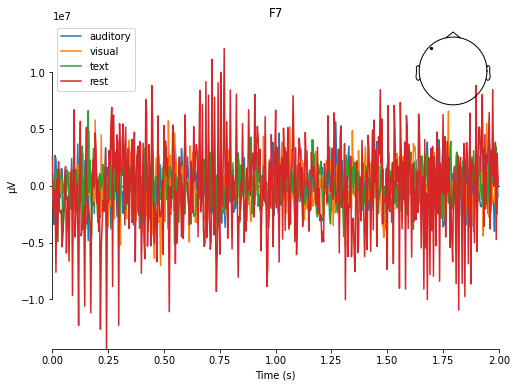

[<Figure size 576x432 with 2 Axes>]

In [56]:
# Plot of evoked responses for brocas area averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')

More than 6 channels, truncating title ...
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


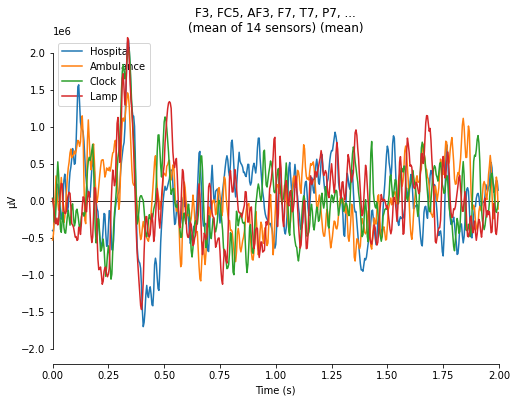

[<Figure size 576x432 with 1 Axes>]

In [57]:
# Plot of evoked responses for all channels averaged ...
evokeds = dict(Hospital=average_hospital, Ambulance=average_ambulance, Clock=average_clock, Lamp=average_lamp)
picks = [ch_names[n] for n in range(0, 14)]
mne.viz.plot_compare_evokeds(evokeds, picks, combine='mean')

combining channels using "mean"
combining channels using "mean"
combining channels using "mean"
combining channels using "mean"


<ipython-input-58-2a2acca60a80>:2: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')


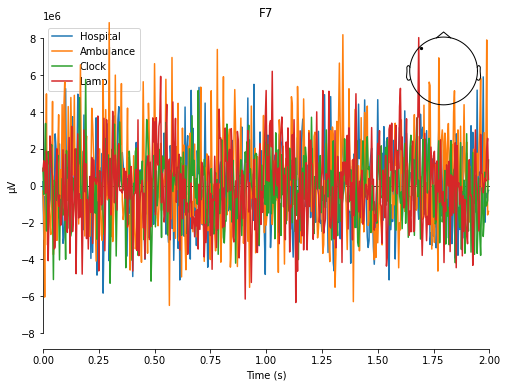

[<Figure size 576x432 with 2 Axes>]

In [58]:
# Plot of evoked responses for brocas area averaged ...
mne.viz.plot_compare_evokeds(evokeds, picks = broca, combine='mean')

Audio preprocessing...

<Epochs |  396 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~21.7 MB, data loaded,
 'Audio/Ambulance': 98
 'Audio/Hospital': 100
 'Audio/Clock': 100
 'Audio/Lamp': 98>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


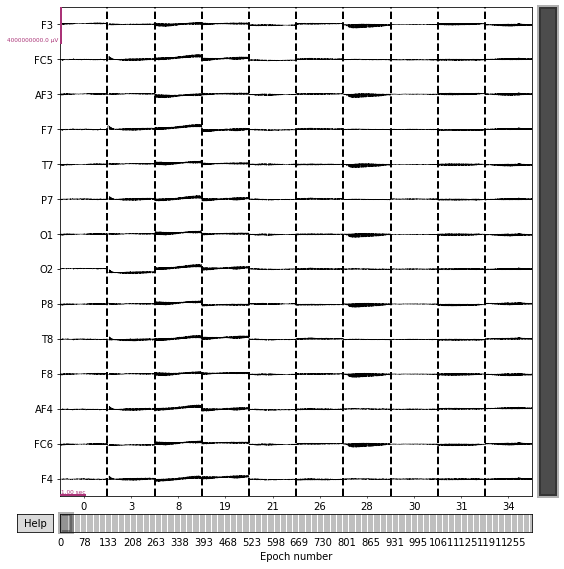

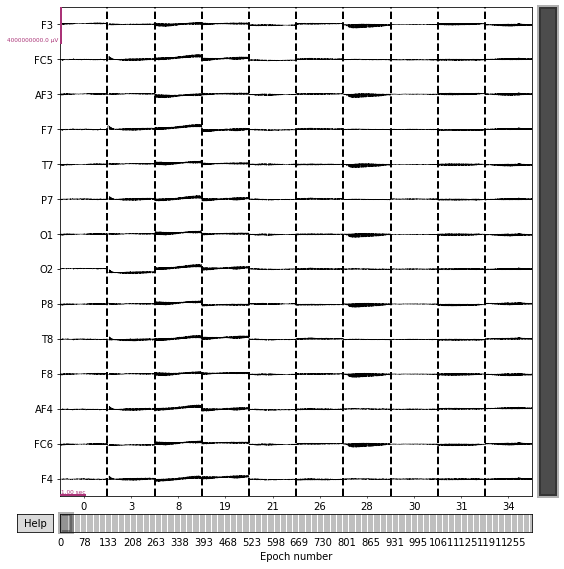

In [59]:
print(speaking_epoched['Audio'])
audio_mne = speaking_epoched['Audio']
audio_mne.plot(n_epochs = 10, scalings = 2000)

    Using multitaper spectrum estimation with 7 DPSS windows


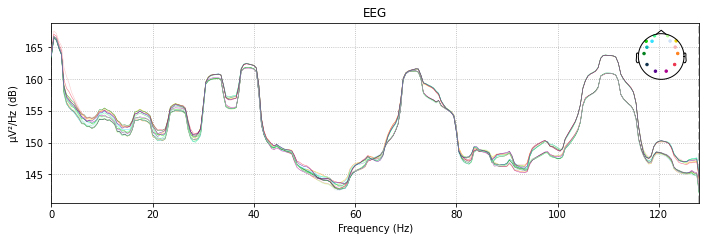

Setting up high-pass filter at 2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Filter length: 423 samples (1.652 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 5544 out of 5544 | elapsed:    1.4s finished


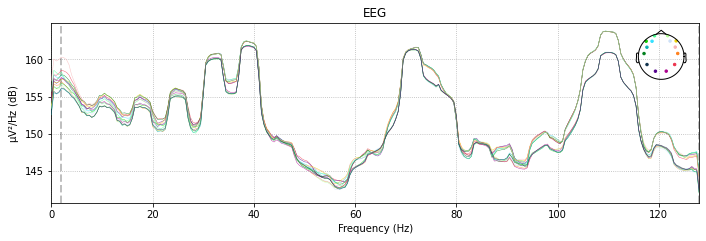

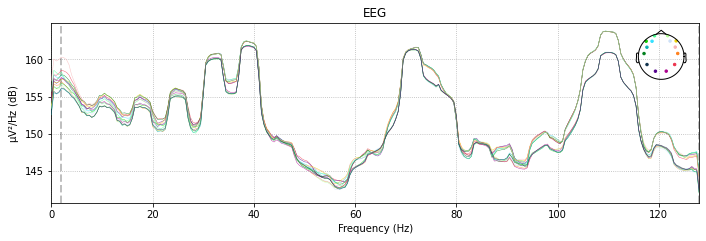

In [60]:
audio_mne.plot_psd()
audio_mne_filt = audio_mne.copy().filter(l_freq = 2, h_freq = None)
audio_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-61-71ccd4847f8c>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_aud.fit(audio_mne_filt)


Fitting ICA took 3.7s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated


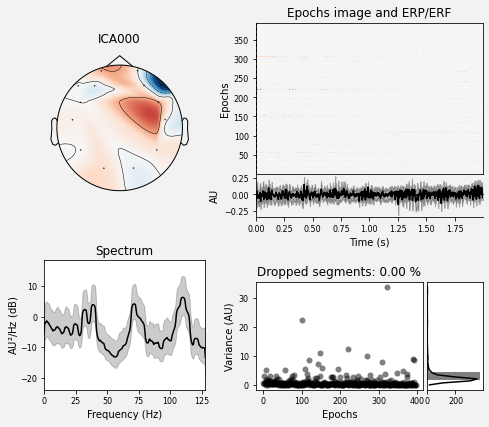

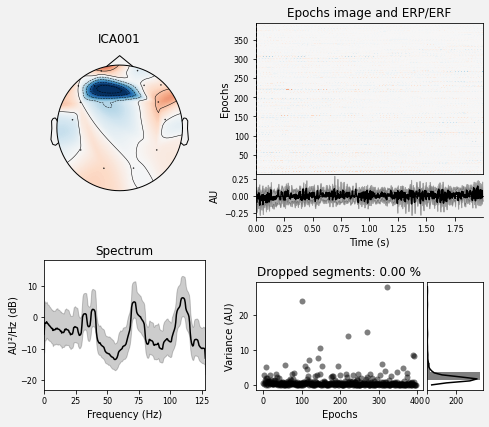

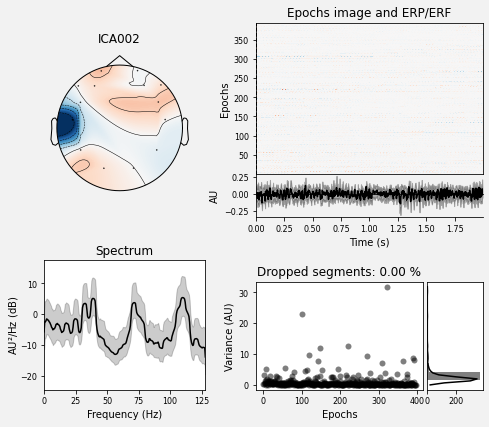

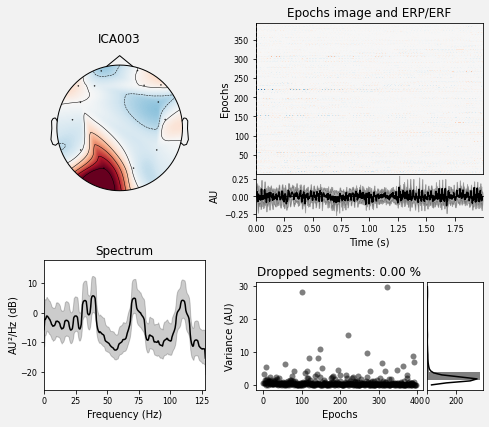

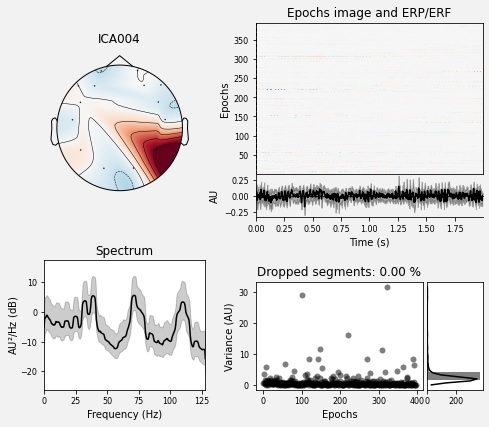

Not setting metadata
396 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


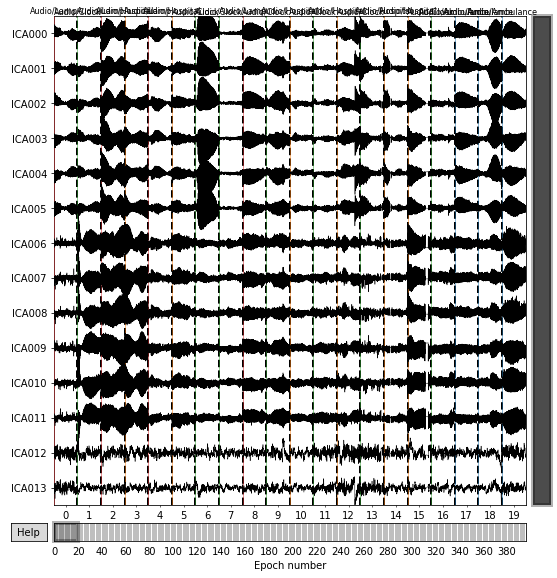

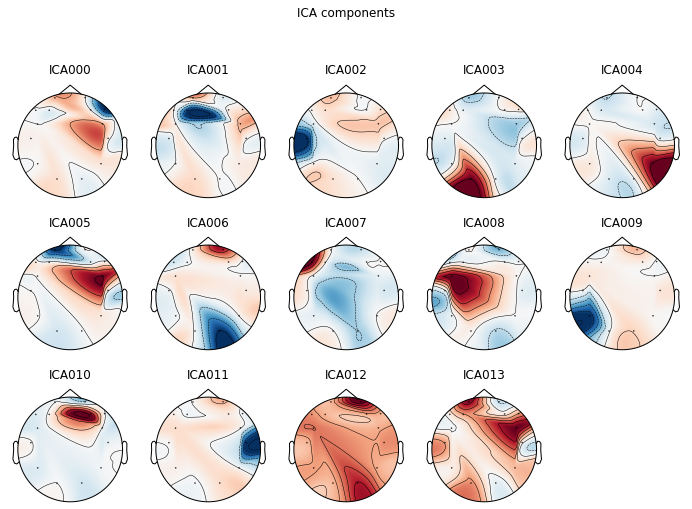

[<MNEFigure size 702x526.68 with 14 Axes>]

In [61]:
ica_aud = mne.preprocessing.ICA()
ica_aud.fit(audio_mne_filt)
ica_aud.plot_properties(audio_mne_filt)
ica_aud.plot_sources(audio_mne_filt)
ica_aud.plot_components()

In [62]:
ica_aud.exclude = [0, 1]
audio_mne_processed = audio_mne.copy()
ica_aud.apply(audio_mne_processed)

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<ipython-input-62-76f6f3aeda49>:3: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_aud.apply(audio_mne_processed)


Number of events,396
Events,Audio/Ambulance: 98Audio/Clock: 100Audio/Hospital: 100Audio/Lamp: 98
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


Text processing...

<Epochs |  398 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~21.8 MB, data loaded,
 'Text/Ambulance': 100
 'Text/Hospital': 98
 'Text/Clock': 100
 'Text/Lamp': 100>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


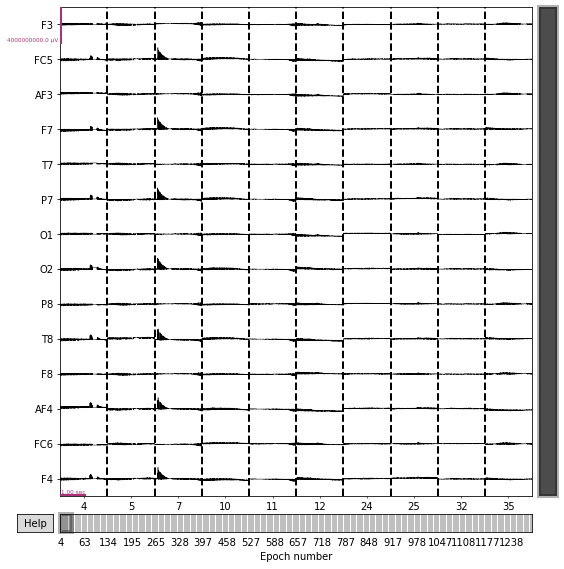

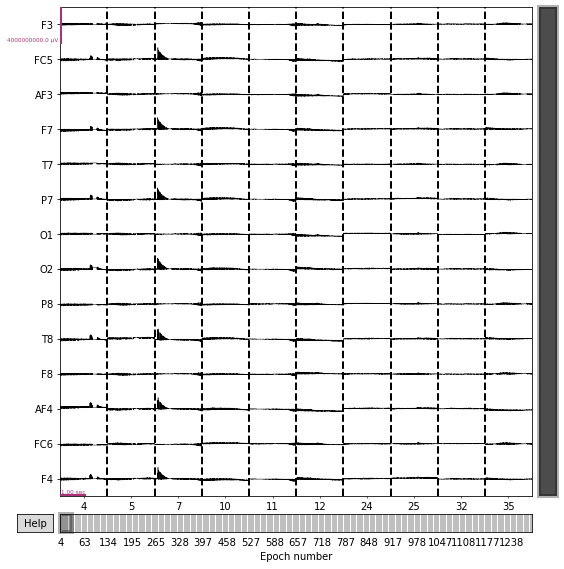

In [63]:
print(speaking_epoched['Text'])
text_mne = speaking_epoched['Text']
text_mne.plot(n_epochs = 10, scalings = 2000)

    Using multitaper spectrum estimation with 7 DPSS windows


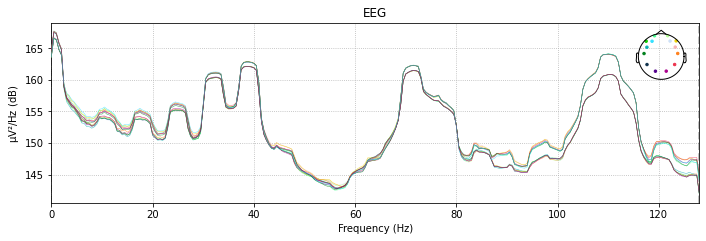

Setting up high-pass filter at 2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Filter length: 423 samples (1.652 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 5572 out of 5572 | elapsed:    1.5s finished


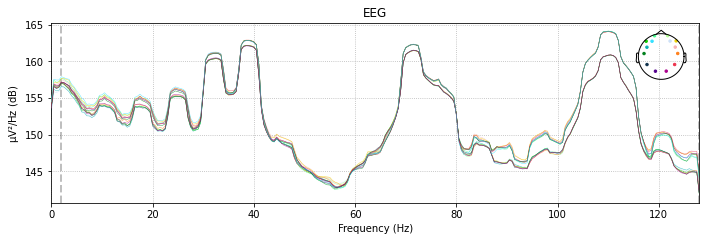

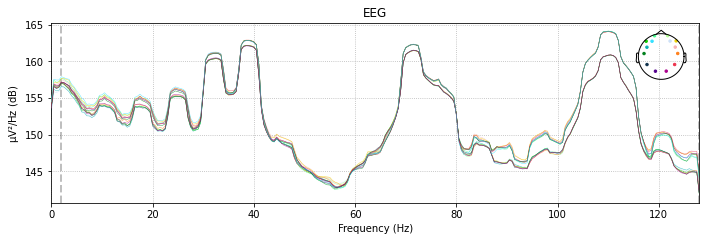

In [64]:
text_mne.plot_psd()
text_mne_filt = text_mne.copy().filter(l_freq = 2, h_freq = None)
text_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-65-c4db4583a401>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_text.fit(text_mne_filt)


Fitting ICA took 10.7s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated


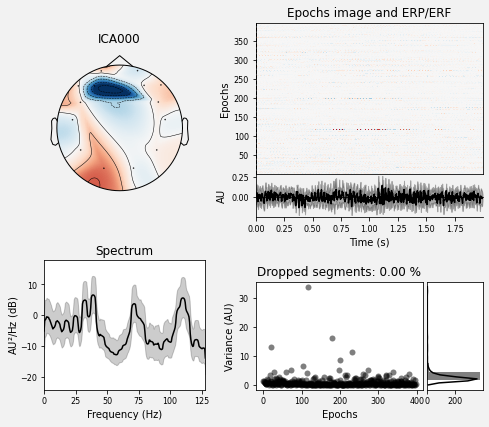

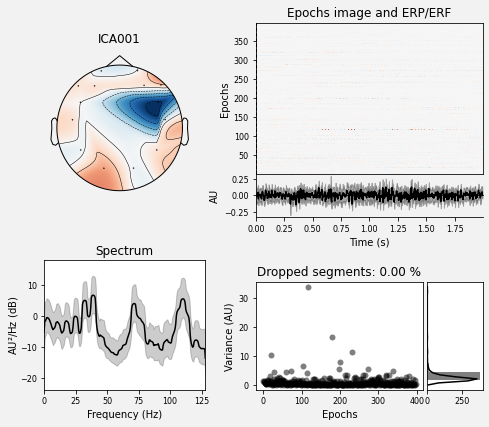

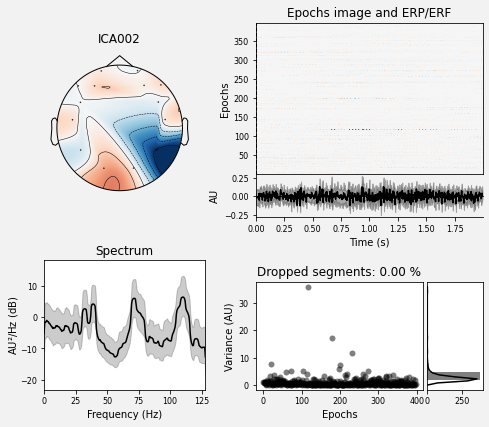

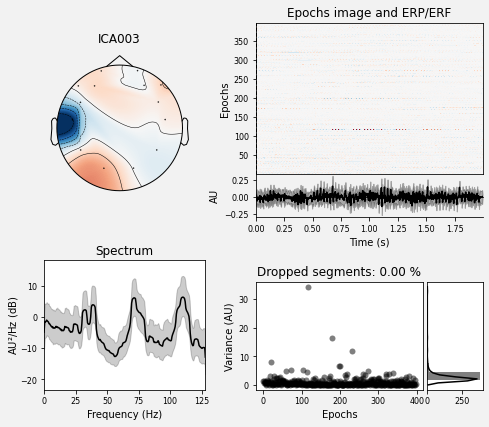

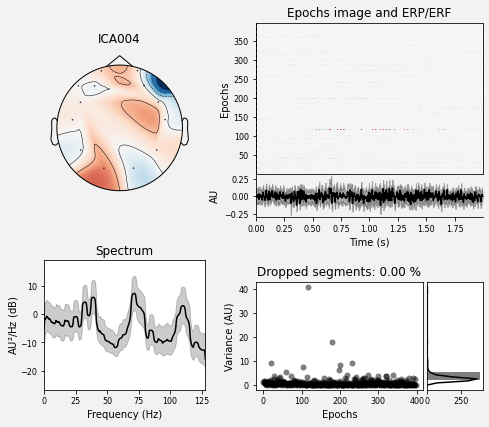

Not setting metadata
398 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


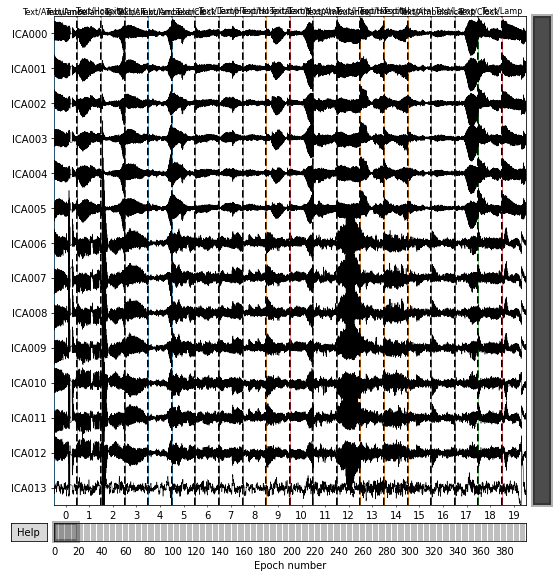

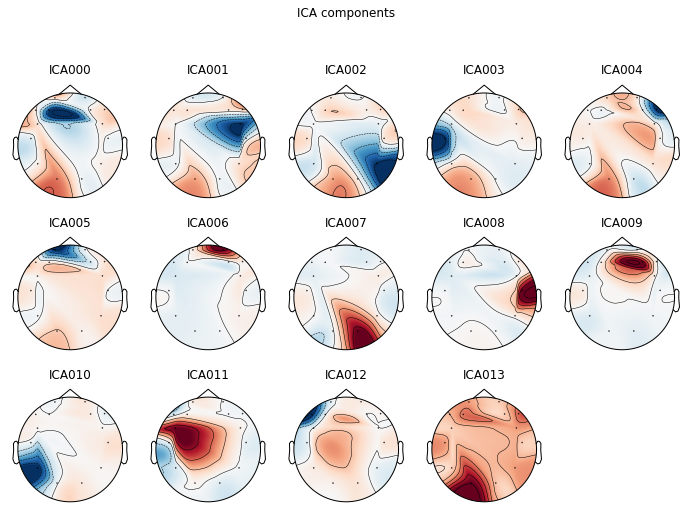

[<MNEFigure size 702x526.68 with 14 Axes>]

In [65]:
ica_text = mne.preprocessing.ICA()
ica_text.fit(text_mne_filt)
ica_text.plot_properties(text_mne_filt)
ica_text.plot_sources(text_mne_filt)
ica_text.plot_components()

In [66]:
ica_text.exclude = [0, 1]
text_mne_processed = text_mne.copy()
ica_text.apply(text_mne_processed)

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<ipython-input-66-63f5548fc231>:3: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_text.apply(text_mne_processed)


Number of events,398
Events,Text/Ambulance: 100Text/Clock: 100Text/Hospital: 98Text/Lamp: 100
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


Visual processing...

<Epochs |  393 events (all good), 0 - 1.99609 sec, baseline 0 – 0 sec, ~21.5 MB, data loaded,
 'Visual/Ambulance': 100
 'Visual/Hospital': 99
 'Visual/Clock': 100
 'Visual/Lamp': 94>


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


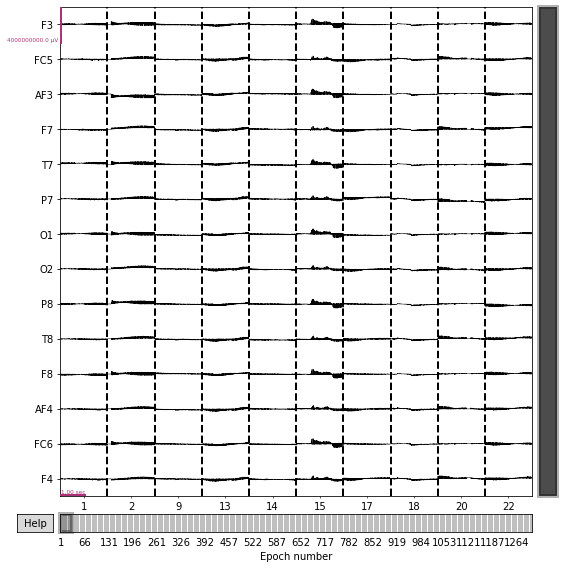

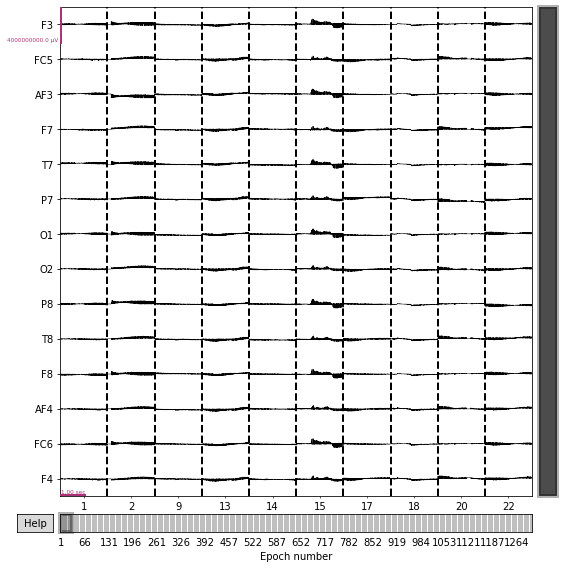

In [67]:
print(speaking_epoched['Visual'])
visual_mne = speaking_epoched['Visual']
visual_mne.plot(n_epochs = 10, scalings = 2000)

    Using multitaper spectrum estimation with 7 DPSS windows


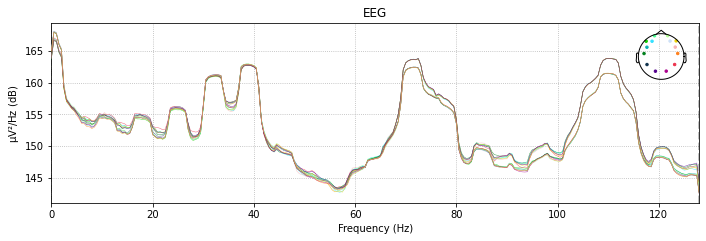

Setting up high-pass filter at 2 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 2.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 1.00 Hz)
- Filter length: 423 samples (1.652 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s


    Using multitaper spectrum estimation with 7 DPSS windows


[Parallel(n_jobs=1)]: Done 5502 out of 5502 | elapsed:    1.5s finished


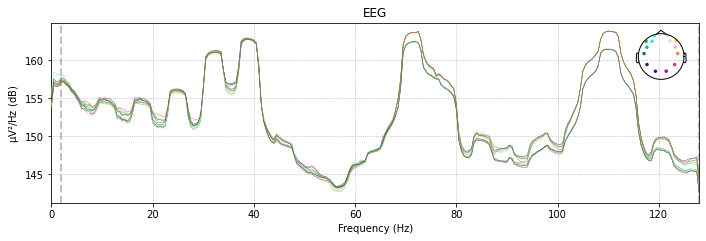

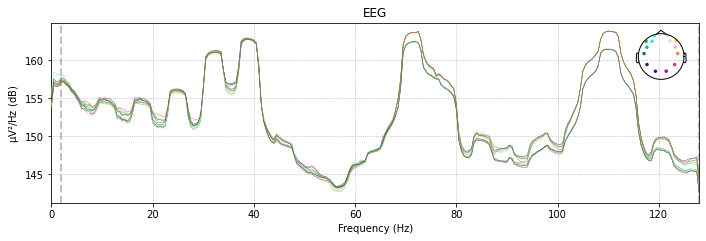

In [68]:
visual_mne.plot_psd()
visual_mne_filt = visual_mne.copy().filter(l_freq = 2, h_freq = None)
visual_mne_filt.plot_psd()

Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components


<ipython-input-69-bc8ecefecdcc>:2: RuntimeWarning: The epochs you passed to ICA.fit() were baseline-corrected. However, we suggest to fit ICA only on data that has been high-pass filtered, but NOT baseline-corrected.
  ica_viz.fit(visual_mne_filt)


Fitting ICA took 6.1s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated


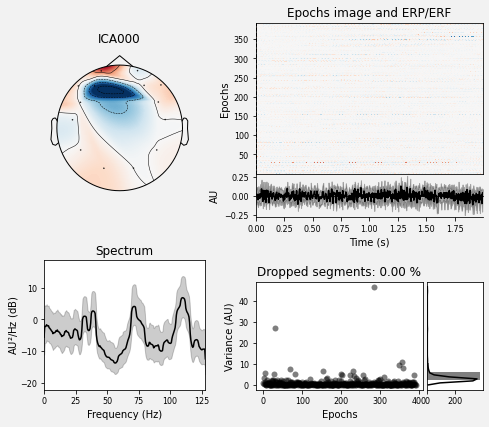

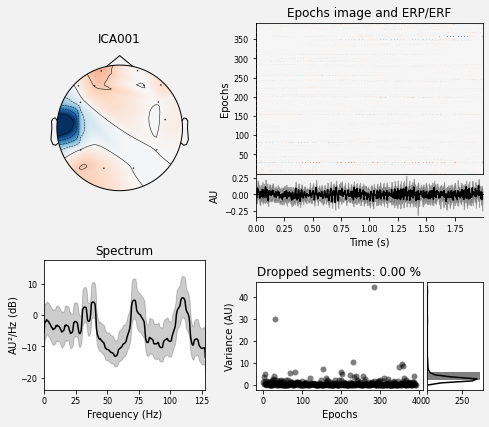

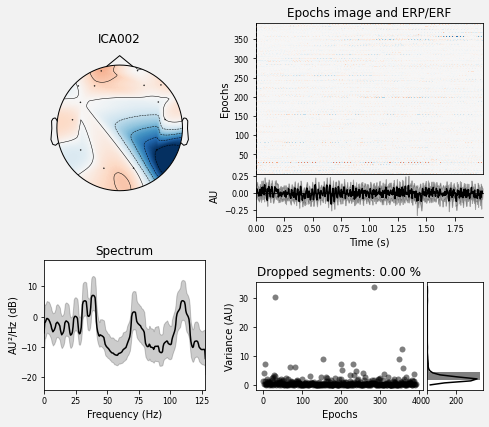

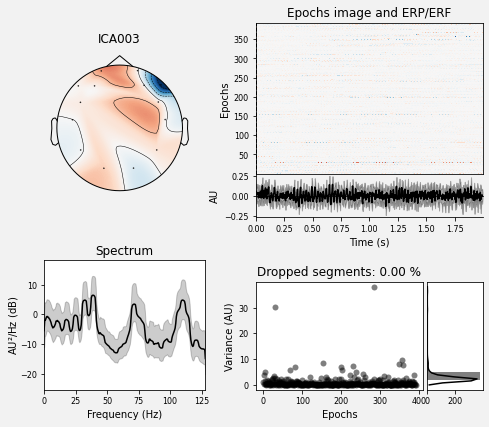

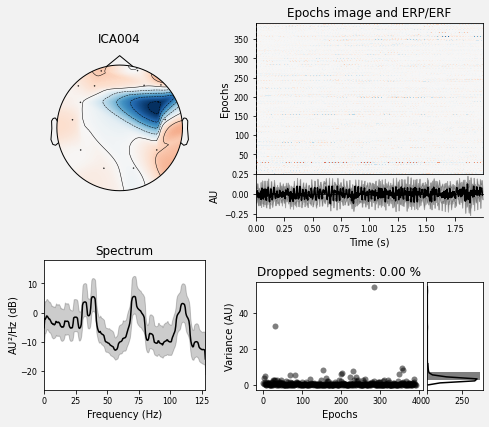

Not setting metadata
393 matching events found
No baseline correction applied
0 projection items activated


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


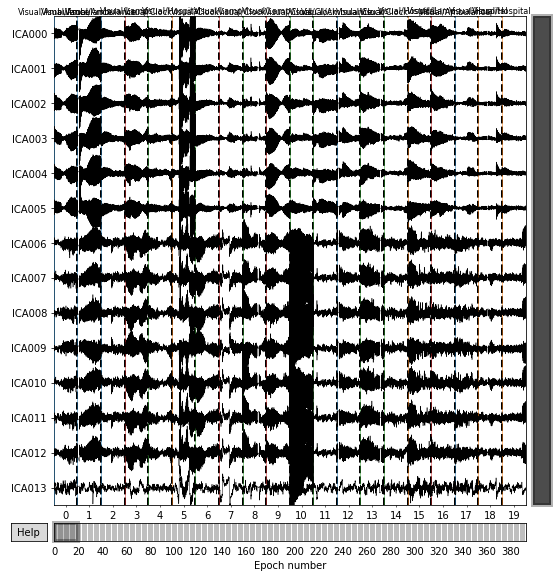

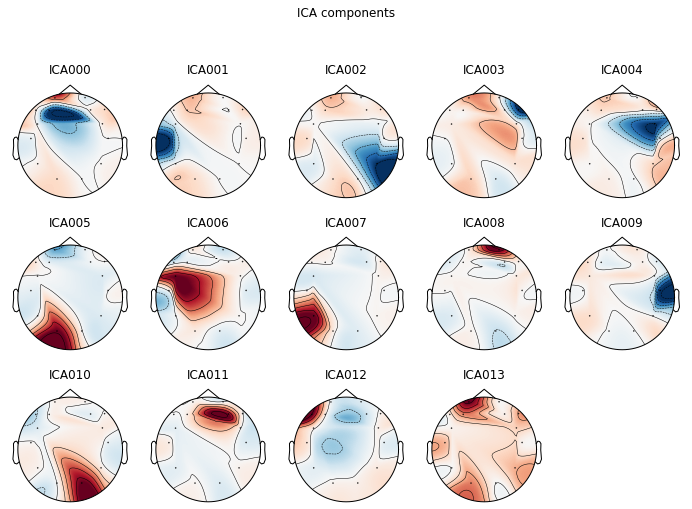

[<MNEFigure size 702x526.68 with 14 Axes>]

In [69]:
ica_viz = mne.preprocessing.ICA()
ica_viz.fit(visual_mne_filt)
ica_viz.plot_properties(visual_mne_filt)
ica_viz.plot_sources(visual_mne_filt)
ica_viz.plot_components()

In [70]:
ica_viz.exclude = [0, 1]
visual_mne_processed = visual_mne.copy()
ica_viz.apply(visual_mne_processed)

Applying ICA to Epochs instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<ipython-input-70-680031762bf5>:3: RuntimeWarning: The data you passed to ICA.apply() was baseline-corrected. Please note that ICA can introduce DC shifts, therefore you may wish to consider baseline-correcting the cleaned data again.
  ica_viz.apply(visual_mne_processed)


Number of events,393
Events,Visual/Ambulance: 100Visual/Clock: 100Visual/Hospital: 99Visual/Lamp: 94
Time range,0.000 – 1.996 sec
Baseline,0.000 – 0.000 sec


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


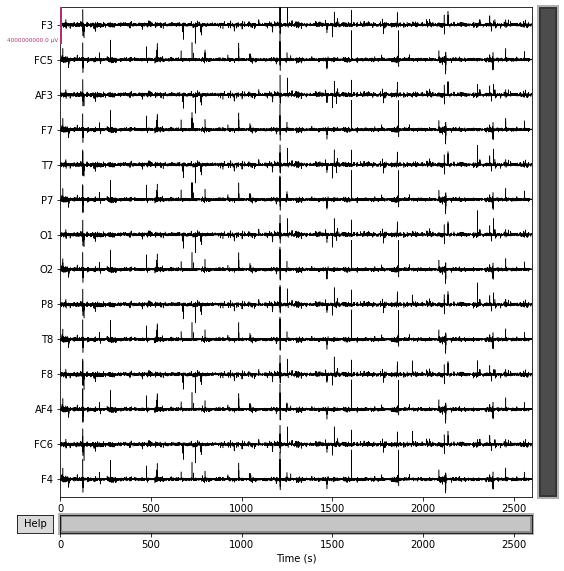

Effective window size : 8.000 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


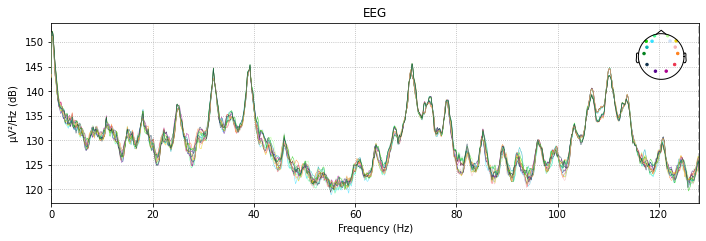

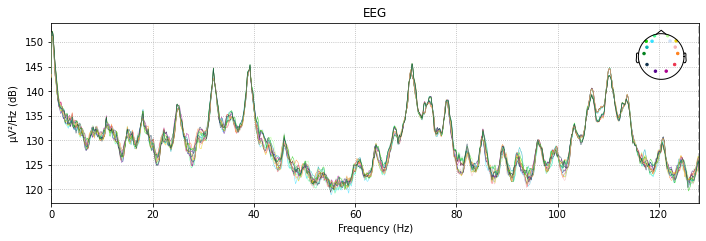

In [71]:
# plot over all spekaing data, and a frequency plot over a 8 second window.
raw_speaking.plot(start = 0, duration = 3000, scalings = 2000)
raw_speaking.plot_psd(fmax=128)


Effective window size : 8.000 (s)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


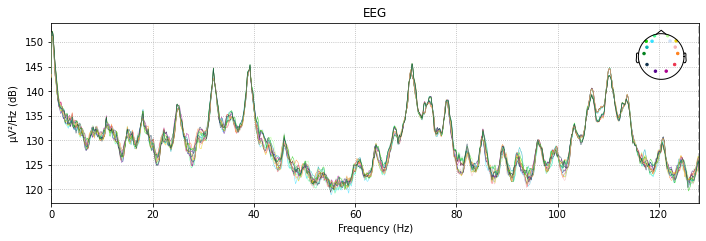

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1.1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 110.00 Hz
- Upper transition bandwidth: 18.00 Hz (-6 dB cutoff frequency: 119.00 Hz)
- Filter length: 845 samples (3.301 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.1s remaining:    0.0s


Setting up band-stop filter from 70 - 78 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 70.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 70.25 Hz)
- Upper passband edge: 77.50 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 77.75 Hz)
- Filter length: 1691 samples (6.605 sec)



[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 1691 samples (6.605 sec)



[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s


Effective window size : 8.000 (s)


[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s finished


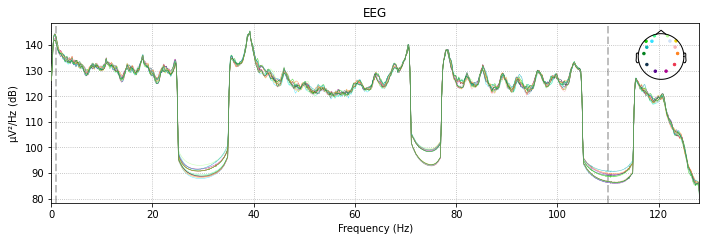

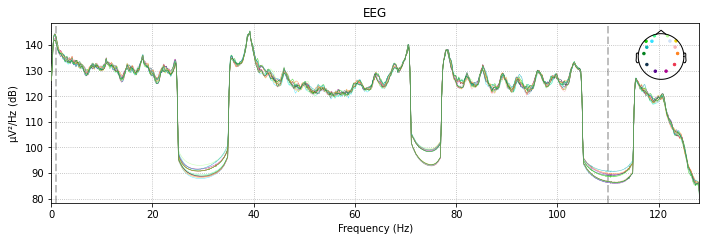

In [72]:
# High pass, Low pass and notch filtering applied to the data...

raw_speaking.plot_psd(fmax=128)

low_cut = 1
hi_cut  = 110
freqs = (74, 110)

raw_speaking_filt = raw_speaking.copy().filter(l_freq=low_cut, h_freq=hi_cut)
raw_speaking_filt = raw_speaking_filt.copy().notch_filter(freqs =74, notch_widths = 6).notch_filter(freqs =(30, 110), notch_widths = 10)
raw_speaking_filt.plot_psd(fmax=128)


Fitting ICA to data using 14 channels (please be patient, this may take a while)
Selecting by non-zero PCA components: 14 components
Fitting ICA took 26.2s.
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
1300 matching events found
No baseline correction applied
0 projection items activated


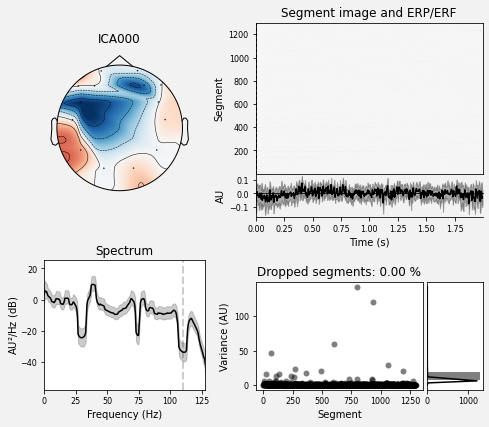

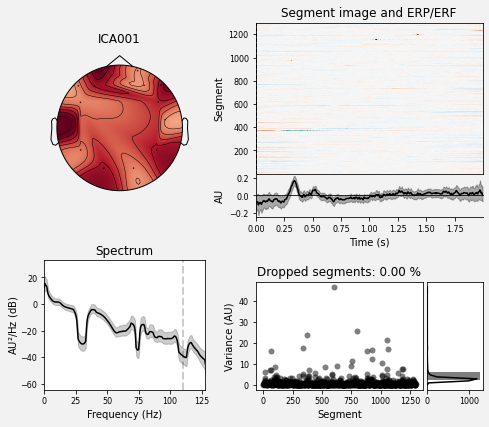

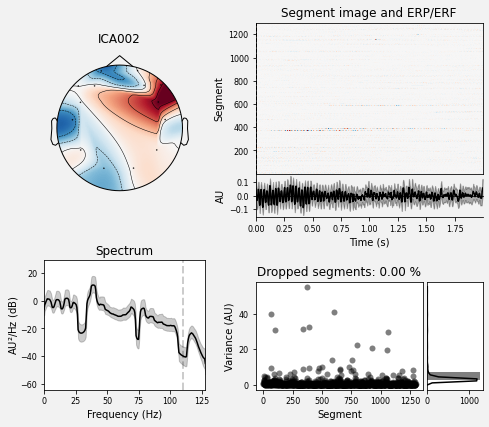

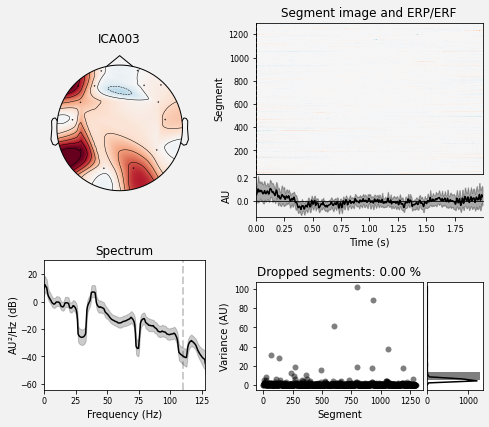

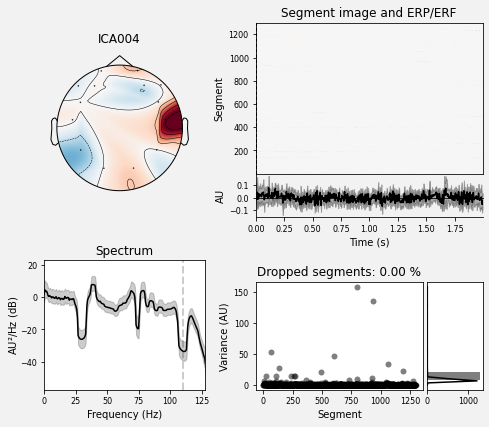

Creating RawArray with float64 data, n_channels=14, n_times=665600
    Range : 0 ... 665599 =      0.000 ...  2599.996 secs
Ready.


/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


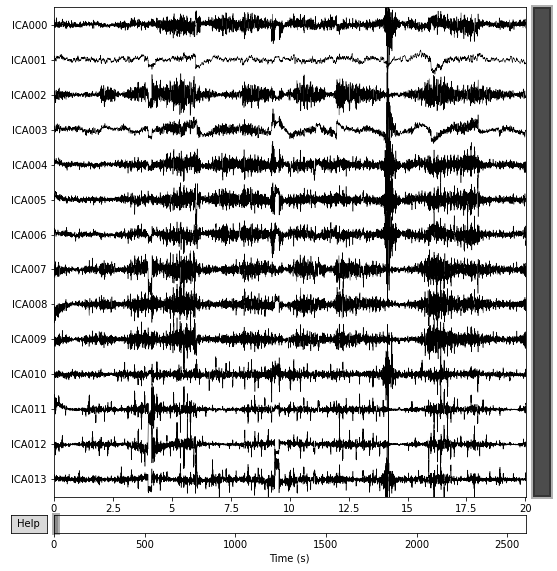

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 0 ICA components
    Projecting back using 14 PCA components


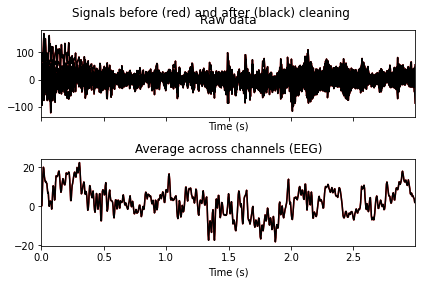

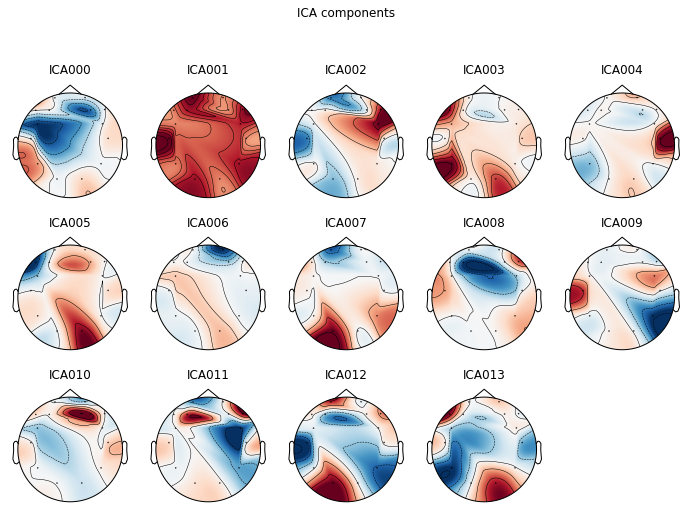

[<MNEFigure size 702x526.68 with 14 Axes>]

In [73]:
# Fitting of ICA and plot of various graphs for analysis...

ica = mne.preprocessing.ICA()
ica.fit(raw_speaking_filt)
ica.plot_properties(raw_speaking_filt)
ica.plot_sources(raw_speaking_filt)
ica.plot_overlay(raw_speaking_filt)
ica.plot_components()


In [74]:
# input into the ICA class which components to exclude, then apply the transformation to the raw unfiltered data...
ica.exclude = [0, 1]
speaking_processed_mne = raw_speaking.copy()
ica.apply(speaking_processed_mne)

Applying ICA to Raw instance
    Transforming to ICA space (14 components)
    Zeroing out 2 ICA components
    Projecting back using 14 PCA components


<RawArray | 14 x 665600 (2600.0 s), ~71.1 MB, data loaded>

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


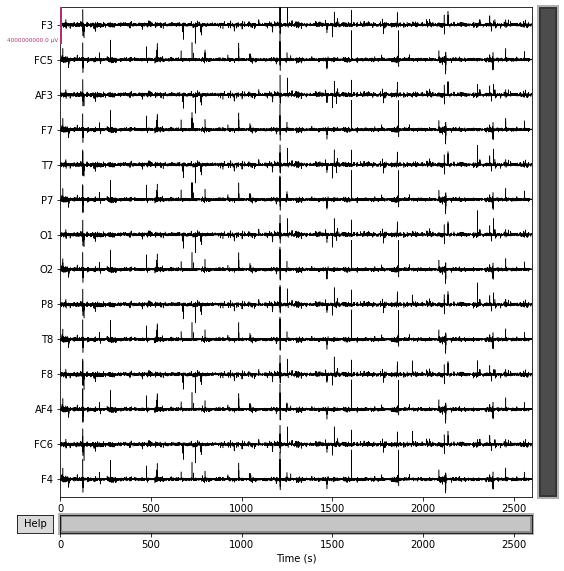

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


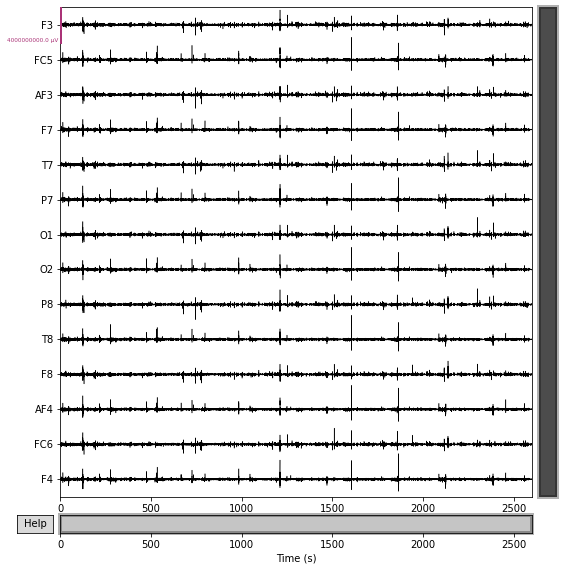

/usr/local/lib/python3.7/dist-packages/matplotlib/colors.py:263: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  c = np.array(c)


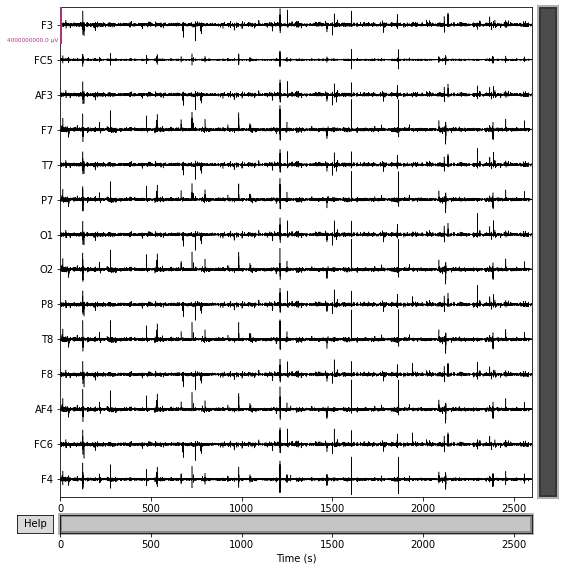

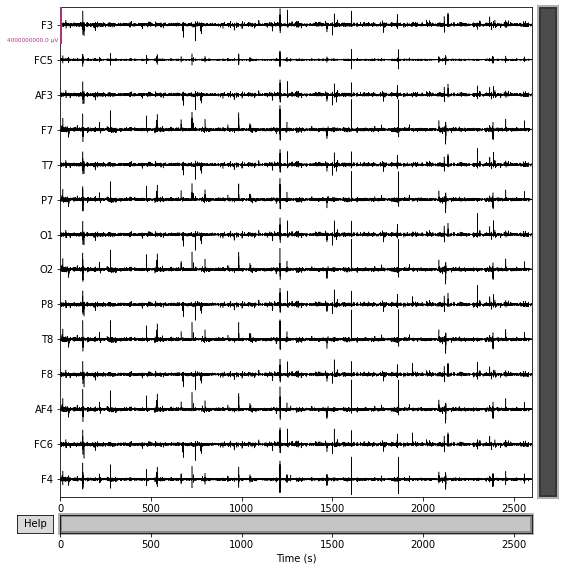

In [75]:
# Plots of Filtered, unfiltered and ICA processed data...
raw_speaking.plot(duration = 3000, scalings = 2000)
raw_speaking_filt.plot(duration = 3000, scalings = 2000)
speaking_processed_mne.plot(duration = 3000, scalings = 2000)

In [76]:
audio_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][audio_mne_processed.to_data_frame()['epoch'].unique()]
visual_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][visual_mne_processed.to_data_frame()['epoch'].unique()]
text_labels = speaking['Label'].to_numpy().reshape(speaking.shape[0] // (512), 512)[:, 0][text_mne_processed.to_data_frame()['epoch'].unique()]
audio_labels.shape, visual_labels.shape, text_labels.shape# = audio_labels

((396,), (393,), (398,))

In [77]:
audio_labels[audio_labels == 'Ambulance'] = 0
audio_labels[audio_labels == 'Hospital'] = 1
audio_labels[audio_labels == 'Clock'] = 2
audio_labels[audio_labels == 'Lamp'] = 3

visual_labels[visual_labels == 'Ambulance'] = 0
visual_labels[visual_labels == 'Hospital'] = 1
visual_labels[visual_labels == 'Clock'] = 2
visual_labels[visual_labels == 'Lamp'] = 3

text_labels[text_labels == 'Ambulance'] = 0
text_labels[text_labels == 'Hospital'] = 1
text_labels[text_labels == 'Clock'] = 2
text_labels[text_labels == 'Lamp'] = 3

In [78]:
# Get the data into a numpy array for ML applications, with each row in the data containing all the features for a single epoch 
# (512*14 features for 512 time points and 14 channels)

speaking_processed = speaking_processed_mne.to_data_frame().drop(columns = ['time']).to_numpy().reshape(speaking.shape[0] // (512), 512 * 14)
audio_df = audio_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
text_df = text_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
visual_df = visual_mne_processed.to_data_frame().drop(columns = ['epoch', 'time', 'condition'])
# visual_processed = visual_mne_processed.to_data_frame().drop(columns = ['time']).to_numpy().reshape(speaking.shape[0] // (512), 512 * 14)
# text_processed = text_mne_processed.to_data_frame().drop(columns = ['time']).to_numpy().reshape(speaking.shape[0] // (512), 512 * 14)
print(audio_df.shape[0]/512, speaking.shape[0]/512)

audio_processed = audio_df.to_numpy().reshape(audio_df.shape[0] // (512), 512 * 14)
text_processed = text_df.to_numpy().reshape(text_df.shape[0] // (512), 512 * 14)
visual_processed = visual_df.to_numpy().reshape(visual_df.shape[0] // (512), 512 * 14)

396.0 1300.0


In [79]:
speaking_processed.shape, audio_processed.shape, visual_processed.shape, text_processed.shape

((1300, 7168), (396, 7168), (393, 7168), (398, 7168))

# Feature extraction

Audio data

In [80]:
X_train_aud, X_test_aud, y_train_aud, y_test_aud = train_test_split(audio_processed, audio_labels)

In [81]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_aud = onehot_encoder.fit_transform(y_train_aud[:, None])
y_train_IE_aud = np.argmax(y_train_aud, axis = 1)
y_test_aud = np.argmax(onehot_encoder.transform(y_test_aud[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_aud.shape, X_test_aud.shape, y_train_aud.shape, y_train_IE_aud.shape, y_test_aud.shape)
y_test_aud
print(onehot_encoder.categories_)

(297, 7168) (99, 7168) (297, 4) (297,) (99,)
[array([0, 1, 2, 3], dtype=object)]


In [82]:
pca = PCA(0.999)
X_train_PCA_aud = pca.fit_transform(X_train_aud)
X_test_PCA_aud = pca.transform(X_test_aud)
print(X_train_aud.shape, X_test_aud.shape, X_train_PCA_aud.shape, X_test_PCA_aud.shape)

(297, 7168) (99, 7168) (297, 284) (99, 284)


In [83]:
y_train_aud_syl = y_train_IE_aud.copy()
y_train_aud_syl[y_train_aud_syl == 1] = 0
y_train_aud_syl[y_train_aud_syl == 2] = 1
y_train_aud_syl[y_train_aud_syl == 3] = 1

y_test_aud_syl = y_test_aud.copy()
y_test_aud_syl[y_test_aud_syl == 1] = 0
y_test_aud_syl[y_test_aud_syl == 2] = 1
y_test_aud_syl[y_test_aud_syl == 3] = 1


In [84]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_aud_syl = onehot_encoder.fit_transform(y_train_aud_syl[:, None])
y_train_IE_aud_syl = np.argmax(y_train_aud_syl, axis = 1)
y_test_aud_syl = np.argmax(onehot_encoder.transform(y_test_aud_syl[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_aud.shape, X_test_aud.shape, y_train_aud_syl.shape, y_train_IE_aud_syl.shape, y_test_aud_syl.shape)
y_test_aud_syl

(297, 7168) (99, 7168) (297, 2) (297,) (99,)


array([1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0])

In [85]:
y_train_aud_vowel = y_train_IE_aud.copy()
y_train_aud_vowel[y_train_aud_vowel == 1] = 1
y_train_aud_vowel[y_train_aud_vowel == 2] = 1
y_train_aud_vowel[y_train_aud_vowel == 3] = 0

y_test_aud_vowel = y_test_aud.copy()
y_test_aud_vowel[y_test_aud_vowel == 1] = 1
y_test_aud_vowel[y_test_aud_vowel == 2] = 1
y_test_aud_vowel[y_test_aud_vowel == 3] = 0

In [86]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_aud_vowel = onehot_encoder.fit_transform(y_train_aud_vowel[:, None])
y_train_IE_aud_vowel = np.argmax(y_train_aud_vowel, axis = 1)
y_test_aud_vowel = np.argmax(onehot_encoder.transform(y_test_aud_vowel[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_aud.shape, X_test_aud.shape, y_train_aud_vowel.shape, y_train_IE_aud_vowel.shape, y_test_aud_vowel.shape)
y_test_aud_vowel

(297, 7168) (99, 7168) (297, 2) (297,) (99,)


array([0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1,
       0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0])

Visual data

In [87]:
X_train_vis, X_test_vis, y_train_vis, y_test_vis = train_test_split(visual_processed, visual_labels)

In [88]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_vis = onehot_encoder.fit_transform(y_train_vis[:, None])
y_train_IE_vis = np.argmax(y_train_vis, axis = 1)
y_test_vis = np.argmax(onehot_encoder.transform(y_test_vis[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_vis.shape, X_test_vis.shape, y_train_vis.shape, y_train_IE_vis.shape, y_test_vis.shape)
y_test_vis

(294, 7168) (99, 7168) (294, 4) (294,) (99,)


array([1, 2, 1, 1, 0, 3, 1, 2, 1, 0, 3, 2, 3, 1, 1, 2, 3, 2, 1, 0, 0, 2,
       1, 0, 0, 3, 2, 3, 3, 1, 1, 3, 2, 3, 3, 3, 2, 1, 2, 0, 3, 2, 2, 2,
       0, 1, 2, 1, 3, 2, 3, 2, 1, 2, 2, 2, 2, 0, 2, 3, 1, 0, 3, 0, 3, 3,
       1, 0, 0, 2, 0, 1, 1, 3, 3, 0, 1, 1, 2, 1, 0, 2, 2, 3, 0, 1, 1, 0,
       3, 2, 1, 2, 2, 3, 0, 2, 2, 3, 1])

In [89]:
pca = PCA(0.999)
X_train_PCA_vis = pca.fit_transform(X_train_vis)
X_test_PCA_vis = pca.transform(X_test_vis)
print(X_train_vis.shape, X_test_vis.shape, X_train_PCA_vis.shape, X_test_PCA_vis.shape)

(294, 7168) (99, 7168) (294, 281) (99, 281)


In [90]:
y_train_vis_syl = y_train_IE_vis.copy()
y_train_vis_syl[y_train_vis_syl == 1] = 0
y_train_vis_syl[y_train_vis_syl == 2] = 1
y_train_vis_syl[y_train_vis_syl == 3] = 1

y_test_vis_syl = y_test_vis.copy()
y_test_vis_syl[y_test_vis_syl == 1] = 0
y_test_vis_syl[y_test_vis_syl == 2] = 1
y_test_vis_syl[y_test_vis_syl == 3] = 1

In [91]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_vis_syl = onehot_encoder.fit_transform(y_train_vis_syl[:, None])
y_train_IE_vis_syl = np.argmax(y_train_vis_syl, axis = 1)
y_test_vis_syl = np.argmax(onehot_encoder.transform(y_test_vis_syl[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_vis.shape, X_test_vis.shape, y_train_vis_syl.shape, y_train_IE_vis_syl.shape, y_test_vis_syl.shape)
y_test_vis_syl

(294, 7168) (99, 7168) (294, 2) (294,) (99,)


array([0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0,
       1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0])

In [92]:
y_train_vis_vowel = y_train_IE_vis.copy()
y_train_vis_vowel[y_train_vis_vowel == 1] = 1
y_train_vis_vowel[y_train_vis_vowel == 2] = 1
y_train_vis_vowel[y_train_vis_vowel == 3] = 0

y_test_vis_vowel = y_test_vis.copy()
y_test_vis_vowel[y_test_vis_vowel == 1] = 1
y_test_vis_vowel[y_test_vis_vowel == 2] = 1
y_test_vis_vowel[y_test_vis_vowel == 3] = 0

In [93]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_vis_vowel = onehot_encoder.fit_transform(y_train_vis_vowel[:, None])
y_train_IE_vis_vowel = np.argmax(y_train_vis_vowel, axis = 1)
y_test_vis_vowel = np.argmax(onehot_encoder.transform(y_test_vis_vowel[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_vis.shape, X_test_vis.shape, y_train_vis_vowel.shape, y_train_IE_vis_vowel.shape, y_test_vis_vowel.shape)
y_test_vis_vowel

(294, 7168) (99, 7168) (294, 2) (294,) (99,)


array([1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1])

Text data

In [94]:
X_train_text, X_test_text, y_train_text, y_test_text = train_test_split(text_processed, text_labels)

In [95]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_text = onehot_encoder.fit_transform(y_train_text[:, None])
y_train_IE_text = np.argmax(y_train_text, axis = 1)
y_test_text = np.argmax(onehot_encoder.transform(y_test_text[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_text.shape, X_test_text.shape, y_train_text.shape, y_train_IE_text.shape, y_test_text.shape)
y_test_text

(298, 7168) (100, 7168) (298, 4) (298,) (100,)


array([0, 2, 3, 1, 2, 2, 0, 1, 1, 3, 3, 2, 0, 3, 1, 2, 0, 1, 2, 1, 0, 0,
       3, 0, 1, 0, 0, 1, 3, 0, 2, 0, 3, 2, 3, 0, 3, 3, 3, 1, 3, 0, 1, 0,
       0, 1, 3, 3, 2, 1, 2, 1, 3, 3, 1, 2, 1, 3, 3, 2, 1, 1, 2, 3, 2, 2,
       3, 0, 1, 2, 1, 2, 1, 2, 0, 2, 3, 1, 0, 3, 1, 3, 2, 2, 0, 3, 1, 1,
       2, 2, 2, 1, 0, 1, 2, 2, 3, 3, 2, 2])

In [96]:
pca = PCA(0.999)
X_train_PCA_text = pca.fit_transform(X_train_text)
X_test_PCA_text = pca.transform(X_test_text)
print(X_train_text.shape, X_test_text.shape, X_train_PCA_text.shape, X_test_PCA_text.shape)

(298, 7168) (100, 7168) (298, 286) (100, 286)


In [97]:
y_train_text_syl = y_train_IE_text.copy()
y_train_text_syl[y_train_text_syl == 1] = 0
y_train_text_syl[y_train_text_syl == 2] = 1
y_train_text_syl[y_train_text_syl == 3] = 1

y_test_text_syl = y_test_text.copy()
y_test_text_syl[y_test_text_syl == 1] = 0
y_test_text_syl[y_test_text_syl == 2] = 1
y_test_text_syl[y_test_text_syl == 3] = 1

In [98]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_text_syl = onehot_encoder.fit_transform(y_train_text_syl[:, None])
y_train_IE_text_syl = np.argmax(y_train_text_syl, axis = 1)
y_test_text_syl = np.argmax(onehot_encoder.transform(y_test_text_syl[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_text.shape, X_test_text.shape, y_train_text_syl.shape, y_train_IE_text_syl.shape, y_test_text_syl.shape)
y_test_text_syl

(298, 7168) (100, 7168) (298, 2) (298,) (100,)


array([0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0,
       0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1])

In [99]:
y_train_text_vowel = y_train_IE_text.copy()
y_train_text_vowel[y_train_text_vowel == 1] = 1
y_train_text_vowel[y_train_text_vowel == 2] = 1
y_train_text_vowel[y_train_text_vowel == 3] = 0

y_test_text_vowel = y_test_text.copy()
y_test_text_vowel[y_test_text_vowel == 1] = 1
y_test_text_vowel[y_test_text_vowel == 2] = 1
y_test_text_vowel[y_test_text_vowel == 3] = 0

In [100]:
onehot_encoder = OneHotEncoder(sparse=False)
y_train_text_vowel = onehot_encoder.fit_transform(y_train_text_vowel[:, None])
y_train_IE_text_vowel = np.argmax(y_train_text_vowel, axis = 1)
y_test_text_vowel = np.argmax(onehot_encoder.transform(y_test_text_vowel[:, None]), axis = 1)
#X_train = X_train.reshape(X_train.shape[0], 299 *299 * 3)
#X_test = X_test.reshape(X_test.shape[0], 299 *299 * 3)
print(X_train_text.shape, X_test_text.shape, y_train_text_vowel.shape, y_train_IE_text_vowel.shape, y_test_text_vowel.shape)
y_test_text_vowel

(298, 7168) (100, 7168) (298, 2) (298,) (100,)


array([0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1])

# Application of ML models for audio data (4-way)

In [ ]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [ ]:
%%time
# Train a model to classify speech...
nEpoch_DNN_aud = 500
nBatchSize_DNN_aud =4

DNN_simple_aud = Sequential()
DNN_simple_aud.add(Dense(50, input_dim= X_train_PCA_aud.shape[1]))
DNN_simple_aud.add(Dense(100, input_dim=100))
DNN_simple_aud.add(Dense(100, input_dim=100))
DNN_simple_aud.add(Dropout(0.2))
DNN_simple_aud.add(Dense(100, input_dim=100))
DNN_simple_aud.add(Dense(4, input_dim = 100, activation='sigmoid'))
DNN_simple_aud.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_aud.summary()
print(X_train_aud.shape, X_train_PCA_aud.shape, y_train_aud.shape)
simple_DNN_training_aud = DNN_simple_aud.fit(X_train_PCA_aud, y_train_aud, epochs=nEpoch_DNN_aud, batch_size=nBatchSize_DNN_aud)

In [ ]:
#Generate predictions for the simple DNN
DNN_simple_pred_aud = np.argmax(DNN_simple_aud.predict(X_test_PCA_aud), axis = 1)
DNN_simple_pred_aud

#Calculate prediction accuracy...
accuracy_score(y_test_aud, DNN_simple_pred_aud[:, None])

In [ ]:
plt.plot(simple_DNN_training_aud.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_aud.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_aud, DNN_simple_pred_aud[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# # format data for input to the CNN...
X_train_CNN_aud = X_train_aud.reshape(X_train_aud.shape[0], 512, 14, 1)
X_test_CNN_aud = X_test_aud.reshape(X_test_aud.shape[0],512, 14, 1)
# #test_submit_set = np.array(test_submit_set).reshape(test_submit_set.shape[0], 28, 28, 1)

In [ ]:
%%time
nEpoch_CNN_aud = 100
nBatchSize_CNN_aud = 4

CNN_simple_aud = Sequential()
#add model layers
CNN_simple_aud.add(Conv2D(10, kernel_size=3, activation = 'relu', input_shape=(512, 14, 1)))
CNN_simple_aud.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_aud.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_aud.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_aud.add(Flatten())
CNN_simple_aud.add(Dropout(0.2))
CNN_simple_aud.add(Dense(4, activation= 'softmax'))
CNN_simple_aud.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
CNN_simple_aud.summary()
simple_CNN_training_aud = CNN_simple_aud.fit(X_train_CNN_aud, y_train_aud, epochs=nEpoch_CNN_aud, batch_size=nBatchSize_CNN_aud)

In [ ]:
CNN_simple_pred_aud = np.argmax(CNN_simple_aud.predict(X_test_CNN_aud), axis = 1)
accuracy_score(y_test_aud, CNN_simple_pred_aud[:, None])

In [ ]:
plt.plot(simple_CNN_training_aud.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_CNN_training_aud.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_aud, CNN_simple_pred_aud[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
RF_train_aud = True

test_perf_RF_aud = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_aud:
    RF_init_aud= RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_aud.fit(X_train_PCA_aud, y_train_IE_aud)
    pickle.dump(RF_train_aud, open(str('RF_init_aud'), 'wb'))
else:
    RF_init_aud = pickle.load(open(str('RF_init_aud'), 'rb'))


In [ ]:
if test_perf_RF_aud:
    RF_init_pred_train_aud = (RF_init_aud.predict(X_train_PCA_aud))

    RF_init_pred_test_aud = (RF_init_aud.predict(X_test_PCA_aud))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_aud.shape, y_train_IE_aud.shape)
    print(RF_init_pred_train_aud[0], y_train_IE_aud[0])
    
    print(accuracy_score(RF_init_pred_train_aud, y_train_IE_aud))
    print(accuracy_score(RF_init_pred_test_aud, y_test_aud))
    confusion_mtx = confusion_matrix(y_test_aud, RF_init_pred_test_aud)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [ ]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



In [ ]:
%%time


RF_single_aud = RandomForestClassifier()

RF_single_random_search_aud = RandomizedSearchCV(estimator = RF_single_aud, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_aud.fit(X_train_PCA_aud, y_train_IE_aud)


print(RF_single_random_search_aud.best_params_)
RF_single_hps_aud = RF_single_random_search_aud.best_params_


In [ ]:
RF_single_hps_aud

In [ ]:
(RF_single_random_search_aud).cv_results_

In [ ]:
RF_tuned_aud = RandomForestClassifier(n_estimators = RF_single_random_search_aud.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_aud['max_depth'],
                                  min_samples_split = RF_single_hps_aud['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_aud['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_aud.fit(X_train_PCA_aud, y_train_IE_aud)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_aud, open(str('RF_tuned_aud'), 'wb'))

RF_tuned_aud_pred_train = (RF_tuned_aud.predict(X_train_PCA_aud))

RF_tuned_aud_pred_test = (RF_tuned_aud.predict(X_test_PCA_aud))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_aud_pred_train, y_train_IE_aud))
print(accuracy_score(RF_tuned_aud_pred_test, y_test_aud))
confusion_mtx = confusion_matrix(y_test_aud, RF_tuned_aud_pred_test)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Application of ML models for audio data (binary classification between number of syllables)

In [329]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [330]:
%%time
# Train a model to classify speech...
nEpoch_DNN_aud_syl = 500
nBatchSize_DNN_aud_syl =4

DNN_simple_aud_syl = Sequential()
DNN_simple_aud_syl.add(Dense(50, input_dim= X_train_PCA_aud.shape[1]))
DNN_simple_aud_syl.add(Dense(100, input_dim=100))
DNN_simple_aud_syl.add(Dense(100, input_dim=100))
DNN_simple_aud_syl.add(Dropout(0.2))
DNN_simple_aud_syl.add(Dense(100, input_dim=100))
DNN_simple_aud_syl.add(Dense(2, input_dim = 100, activation='sigmoid'))
DNN_simple_aud_syl.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_aud_syl.summary()
print(X_train_aud.shape, X_train_PCA_aud.shape, y_train_aud_syl.shape)
simple_DNN_training_aud_syl = DNN_simple_aud_syl.fit(X_train_PCA_aud, y_train_aud_syl, epochs=nEpoch_DNN_aud_syl, batch_size=nBatchSize_DNN_aud_syl)

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_20 (Dense)            (None, 50)                14200     
                                                                 
 dense_21 (Dense)            (None, 100)               5100      
                                                                 
 dense_22 (Dense)            (None, 100)               10100     
                                                                 
 dropout_4 (Dropout)         (None, 100)               0         
                                                                 
 dense_23 (Dense)            (None, 100)               10100     
                                                                 
 dense_24 (Dense)            (None, 2)                 202       
                                                                 
Total params: 39,702
Trainable params: 39,702
Non-trai

In [331]:
#Generate predictions for the simple DNN
DNN_simple_pred_aud_syl = np.argmax(DNN_simple_aud.predict(X_test_PCA_aud), axis = 1)
DNN_simple_pred_aud_syl

#Calculate prediction accuracy...
accuracy_score(y_test_aud_syl, DNN_simple_pred_aud_syl[:, None])

0.41414141414141414

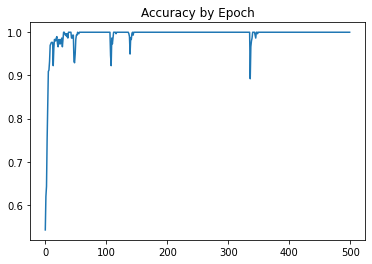

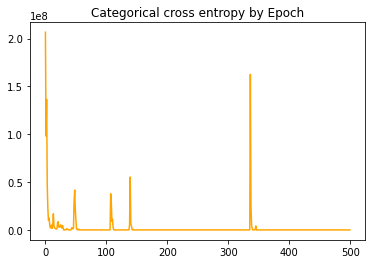

In [332]:
plt.plot(simple_DNN_training_aud_syl.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_aud_syl.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

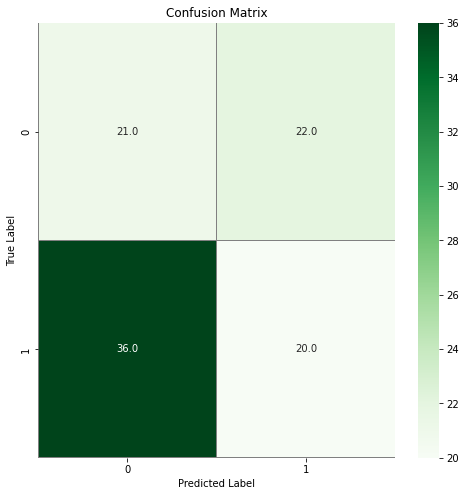

In [333]:
confusion_mtx = confusion_matrix(y_test_aud_syl, DNN_simple_pred_aud_syl[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [348]:
RF_train_aud_syl = True

test_perf_RF_aud_syl = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_aud_syl:
    RF_init_aud_syl= RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_aud_syl.fit(X_train_PCA_aud, y_train_IE_aud_syl)
    pickle.dump(RF_train_aud_syl, open(str('RF_init_aud_syl'), 'wb'))
else:
    RF_init_aud_syl = pickle.load(open(str('RF_init_aud_syl'), 'rb'))


In [349]:
y_train_IE_aud_syl

array([1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0,
       0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1])

(297,) (297, 2)
1 [0. 1.]
1.0
0.48484848484848486


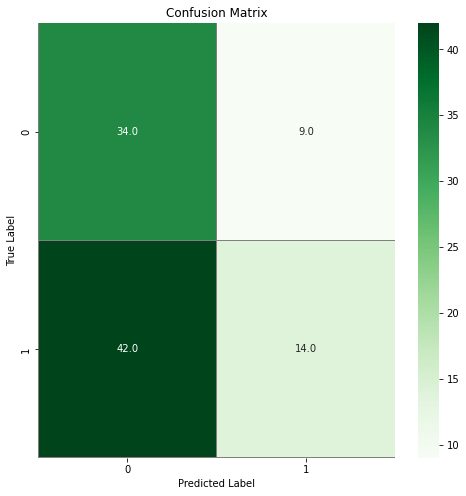

In [350]:
if test_perf_RF_aud_syl:
    RF_init_pred_train_aud_syl = (RF_init_aud_syl.predict(X_train_PCA_aud))

    RF_init_pred_test_aud_syl = (RF_init_aud_syl.predict(X_test_PCA_aud))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_aud_syl.shape, y_train_aud_syl.shape)
    print(RF_init_pred_train_aud_syl[0], y_train_aud_syl[0])
    
    print(accuracy_score(RF_init_pred_train_aud_syl, y_train_IE_aud_syl))
    print(accuracy_score(RF_init_pred_test_aud_syl, y_test_aud_syl))
    confusion_mtx = confusion_matrix(y_test_aud_syl, RF_init_pred_test_aud_syl)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [351]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [352]:
%%time


RF_single_aud_syl = RandomForestClassifier()

RF_single_random_search_aud_syl = RandomizedSearchCV(estimator = RF_single_aud_syl, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_aud_syl.fit(X_train_PCA_aud, y_train_IE_aud_syl)


print(RF_single_random_search_aud_syl.best_params_)
RF_single_hps_aud_syl = RF_single_random_search_aud_syl.best_params_


Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 1400, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_depth': 90}
CPU times: user 7.74 s, sys: 819 ms, total: 8.56 s
Wall time: 5min 2s


In [353]:
RF_single_hps_aud_syl

{'n_estimators': 1400,
 'min_samples_split': 10,
 'min_samples_leaf': 2,
 'max_depth': 90}

In [354]:
(RF_single_random_search_aud_syl).cv_results_

{'mean_fit_time': array([ 8.09479733, 10.25847774,  7.48704181,  2.12252316,  0.75974331,
         4.76652169,  7.9885191 ,  4.95001678,  6.58144712,  8.18182211,
         2.48355837,  7.6414216 ,  5.56687307,  7.24257245,  4.97615013,
         7.04230289,  6.40382614,  6.423386  ,  3.31698146,  3.03481979,
         3.71163182,  4.88628011,  2.37995977,  0.75757337,  6.30760007,
         5.23435531,  2.43561411,  6.44877129,  5.5891674 ,  0.83377576,
         3.1764318 ,  3.25547576,  3.13306947,  3.02594309,  1.50942283,
         2.61483254,  2.99393129,  2.55959978,  7.96713591,  4.91955996,
         3.17551847,  1.59647536,  8.08521929,  7.28767076,  2.24372401,
         0.78012619,  0.77775755,  7.23637791,  1.49950066,  3.02667003]),
 'std_fit_time': array([0.18528466, 0.92553882, 1.60520683, 0.30291343, 0.01154301,
        0.02423379, 0.10942644, 0.04375543, 0.10872397, 0.07620496,
        0.02030142, 0.05935854, 0.04450119, 0.06942033, 0.04169673,
        0.4938954 , 0.58449305,

In [ ]:
RF_tuned_aud_syl = RandomForestClassifier(n_estimators = RF_single_random_search_aud_syl.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_aud_syl['max_depth'],
                                  min_samples_split = RF_single_hps_aud_syl['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_aud_syl['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_aud_syl.fit(X_train_PCA_aud, y_train_IE_aud_syl)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_aud_syl, open(str('RF_tuned_aud_syl'), 'wb'))

RF_tuned_aud_pred_train_syl = (RF_tuned_aud_syl.predict(X_train_PCA_aud))

RF_tuned_aud_pred_test_syl = (RF_tuned_aud_syl.predict(X_test_PCA_aud))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_aud_pred_train_syl, y_train_IE_aud_syl))
print(accuracy_score(RF_tuned_aud_pred_test_syl, y_test_aud_syl))
confusion_mtx = confusion_matrix(y_test_aud_syl, RF_tuned_aud_pred_test_syl)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Application of ML models for audio data (binary classification between vowels)

In [ ]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [109]:
%%time
# Train a model to classify speech...
nEpoch_DNN_aud_vowel = 500
nBatchSize_DNN_aud_vowel =4

DNN_simple_aud_vowel = Sequential()
DNN_simple_aud_vowel.add(Dense(50, input_dim= X_train_PCA_aud.shape[1]))
DNN_simple_aud_vowel.add(Dense(100, input_dim=100))
DNN_simple_aud_vowel.add(Dense(100, input_dim=100))
DNN_simple_aud_vowel.add(Dropout(0.2))
DNN_simple_aud_vowel.add(Dense(100, input_dim=100))
DNN_simple_aud_vowel.add(Dense(2, input_dim = 100, activation='sigmoid'))
DNN_simple_aud_vowel.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_aud_vowel.summary()
print(X_train_aud.shape, X_train_PCA_aud.shape, y_train_aud_vowel.shape)
simple_DNN_training_aud_vowel = DNN_simple_aud_vowel.fit(X_train_PCA_aud, y_train_aud_vowel, epochs=nEpoch_DNN_aud_vowel, batch_size=nBatchSize_DNN_aud_vowel)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 50)                14250     
                                                                 
 dense_6 (Dense)             (None, 100)               5100      
                                                                 
 dense_7 (Dense)             (None, 100)               10100     
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_8 (Dense)             (None, 100)               10100     
                                                                 
 dense_9 (Dense)             (None, 2)                 202       
                                                                 
Total params: 39,752
Trainable params: 39,752
Non-trai

In [105]:
#Generate predictions for the simple DNN
DNN_simple_pred_aud_vowel = np.argmax(DNN_simple_aud_vowel.predict(X_test_PCA_aud), axis = 1)
DNN_simple_pred_aud_vowel

#Calculate prediction accuracy...
accuracy_score(y_test_aud_vowel, DNN_simple_pred_aud_vowel[:, None])

0.48484848484848486

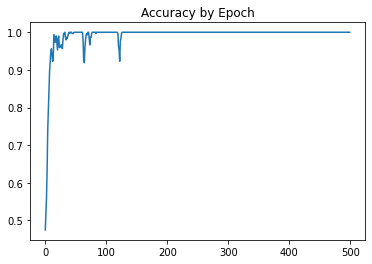

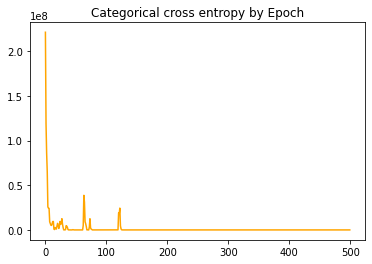

In [106]:
plt.plot(simple_DNN_training_aud_vowel.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_aud_vowel.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

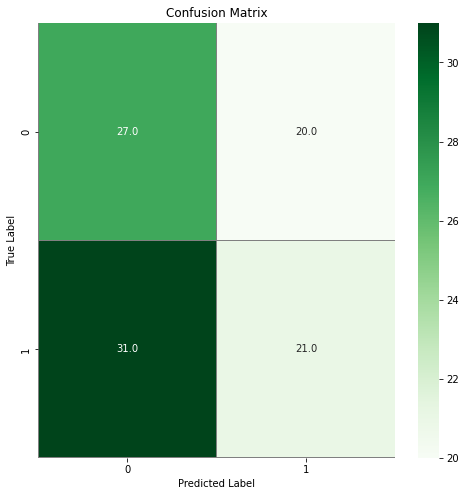

In [107]:
confusion_mtx = confusion_matrix(y_test_aud_vowel, DNN_simple_pred_aud_vowel[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [119]:
RF_train_aud_vowel = True

test_perf_RF_aud_vowel = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_aud_vowel:
    RF_init_aud_vowel = RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_aud_vowel.fit(X_train_PCA_aud, y_train_IE_aud_vowel)
    pickle.dump(RF_train_aud_vowel, open(str('RF_init_aud_vowel'), 'wb'))
else:
    RF_init_aud_vowel = pickle.load(open(str('RF_init_aud_vowel'), 'rb'))


(297,) (297, 2)
1 2
1.0
0.5151515151515151


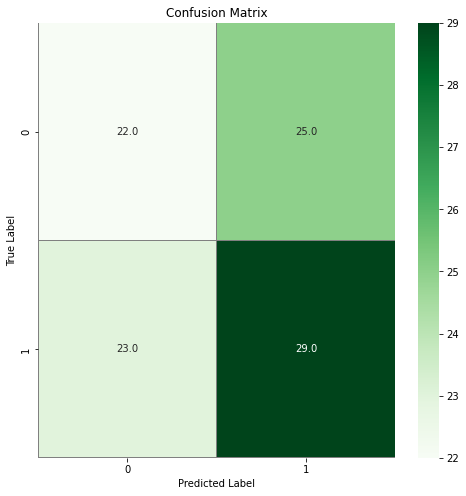

In [120]:
if test_perf_RF_aud_vowel:
    RF_init_pred_train_aud_vowel = (RF_init_aud_vowel.predict(X_train_PCA_aud))

    RF_init_pred_test_aud_vowel = (RF_init_aud_vowel.predict(X_test_PCA_aud))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_aud_vowel.shape, y_train_aud_vowel.shape)
    print(RF_init_pred_train_aud_vowel[0], y_train_IE_aud[0])
    
    print(accuracy_score(RF_init_pred_train_aud_vowel, y_train_IE_aud_vowel))
    print(accuracy_score(RF_init_pred_test_aud_vowel, y_test_aud_vowel))
    confusion_mtx = confusion_matrix(y_test_aud_vowel, RF_init_pred_test_aud_vowel)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [121]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [122]:
%%time


RF_single_aud_vowel = RandomForestClassifier()

RF_single_random_search_aud_vowel = RandomizedSearchCV(estimator = RF_single_aud_vowel, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_aud_vowel.fit(X_train_PCA_aud, y_train_aud_vowel)


print(RF_single_random_search_aud_vowel.best_params_)
RF_single_hps_aud_vowel = RF_single_random_search_aud_vowel.best_params_


Fitting 5 folds for each of 50 candidates, totalling 250 fits
{'n_estimators': 400, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_depth': 90}
CPU times: user 4.75 s, sys: 485 ms, total: 5.23 s
Wall time: 5min 53s


In [123]:
RF_single_hps_aud_vowel

{'n_estimators': 400,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_depth': 90}

In [124]:
(RF_single_random_search_aud_vowel).cv_results_

{'mean_fit_time': array([ 4.45255728,  6.11409817,  3.12018533,  2.97243714,  6.21467648,
         3.48974357,  2.32336073, 10.78581209,  2.40214534, 10.31100187,
         4.95527072,  2.51247735,  7.54002972,  4.71123395,  8.99945407,
         1.04244246,  0.84083142,  8.90212421,  1.64740658,  8.08994651,
         8.98697853,  2.03623891,  2.31377797,  9.99447618, 11.08385267,
         5.91066031,  6.60048876,  3.07587347,  1.03421865, 10.00253749,
         3.65715876,  7.15963087, 10.5700665 ,  1.02012153,  8.36173067,
         7.3867383 ,  6.30950189,  1.69286723,  4.72172408,  1.68690023,
         6.96023107, 10.21903877,  8.0324944 ,  2.20838461,  2.02228012,
         3.03780675,  4.2479425 ,  3.89594603,  1.94952245,  5.45601277]),
 'std_fit_time': array([0.38982291, 0.22982485, 0.12681564, 0.29721046, 0.26132426,
        0.25876759, 0.08805661, 0.38980538, 0.22240057, 0.65004608,
        0.20096375, 0.16151276, 0.44813578, 0.3220615 , 0.30712534,
        0.089514  , 0.00749564,

1.0
0.45454545454545453


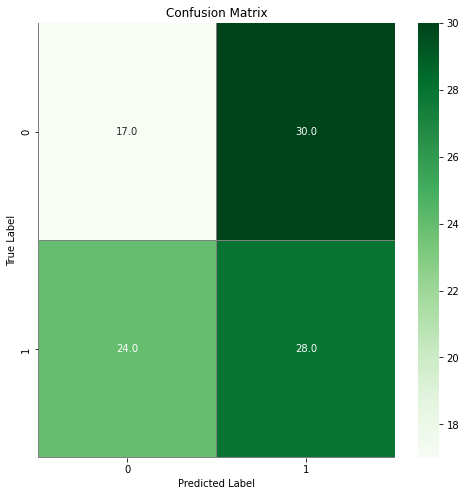

In [128]:
RF_tuned_aud_vowel = RandomForestClassifier(n_estimators = RF_single_random_search_aud_vowel.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_aud_vowel['max_depth'],
                                  min_samples_split = RF_single_hps_aud_vowel['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_aud_vowel['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_aud_vowel.fit(X_train_PCA_aud, y_train_IE_aud_vowel)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_aud_vowel, open(str('RF_tuned_aud_vowel'), 'wb'))

RF_tuned_aud_pred_train_vowel = (RF_tuned_aud_vowel.predict(X_train_PCA_aud))

RF_tuned_aud_pred_test_vowel = (RF_tuned_aud_vowel.predict(X_test_PCA_aud))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_aud_pred_train_vowel, y_train_IE_aud_vowel))
print(accuracy_score(RF_tuned_aud_pred_test_vowel, y_test_aud_vowel))
confusion_mtx = confusion_matrix(y_test_aud_vowel, RF_tuned_aud_pred_test_vowel)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Application of ML models for text data (4-way)

In [ ]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [ ]:
%%time
# Train a model to classify speech...
nEpoch_DNN_text = 500
nBatchSize_DNN_text =4

DNN_simple_text = Sequential()
DNN_simple_text.add(Dense(50, input_dim= X_train_PCA_text.shape[1]))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dropout(0.2))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dense(4, input_dim = 100, activation='sigmoid'))
DNN_simple_text.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_text.summary()
print(X_train_text.shape, X_train_PCA_text.shape, y_train_text.shape)
simple_DNN_training_text = DNN_simple_text.fit(X_train_PCA_text, y_train_text, epochs=nEpoch_DNN_text, batch_size=nBatchSize_DNN_text)

In [ ]:
#Generate predictions for the simple DNN
DNN_simple_pred_text = np.argmax(DNN_simple_text.predict(X_test_PCA_text), axis = 1)
DNN_simple_pred_text

#Calculate prediction accuracy...
accuracy_score(y_test_text, DNN_simple_pred_text[:, None])

In [ ]:
plt.plot(simple_DNN_training_text.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_text.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_text, DNN_simple_pred_text[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# # format data for input to the CNN...
X_train_CNN_text = X_train_text.reshape(X_train_text.shape[0], 512, 14, 1)
X_test_CNN_text = X_test_text.reshape(X_test_text.shape[0],512, 14, 1)
# #test_submit_set = np.array(test_submit_set).reshape(test_submit_set.shape[0], 28, 28, 1)

In [ ]:
%%time
nEpoch_CNN_text = 100
nBatchSize_CNN_text = 4

CNN_simple_text = Sequential()
#add model layers
CNN_simple_text.add(Conv2D(10, kernel_size=3, activation = 'relu', input_shape=(512, 14, 1)))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Flatten())
CNN_simple_text.add(Dropout(0.2))
CNN_simple_text.add(Dense(4, activation= 'softmax'))
CNN_simple_text.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
CNN_simple_text.summary()
simple_CNN_training_text = CNN_simple_text.fit(X_train_CNN_text, y_train_text, epochs=nEpoch_CNN_text, batch_size=nBatchSize_CNN_text)

In [ ]:
CNN_simple_pred_text = np.argmax(CNN_simple_text.predict(X_test_CNN_text), axis = 1)
accuracy_score(y_test_text, CNN_simple_pred_text[:, None])

In [ ]:
plt.plot(simple_CNN_training_text.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_CNN_training_text.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_text, CNN_simple_pred_text[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
RF_train_text = True

test_perf_RF_text = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_text:
    RF_init_text= RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_text.fit(X_train_PCA_text, y_train_IE_text)
    pickle.dump(RF_train_text, open(str('RF_init_text'), 'wb'))
else:
    RF_init_text = pickle.load(open(str('RF_init_text'), 'rb'))


In [ ]:
if test_perf_RF_text:
    RF_init_pred_train_text = (RF_init_text.predict(X_train_PCA_text))

    RF_init_pred_test_text = (RF_init_text.predict(X_test_PCA_text))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_text.shape, y_train_IE_text.shape)
    print(RF_init_pred_train_text[0], y_train_IE_text[0])
    
    print(accuracy_score(RF_init_pred_train_text, y_train_IE_text))
    print(accuracy_score(RF_init_pred_test_text, y_test_text))
    confusion_mtx = confusion_matrix(y_test_text, RF_init_pred_test_text)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [ ]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



In [ ]:
%%time


RF_single_text = RandomForestClassifier()

RF_single_random_search_text = RandomizedSearchCV(estimator = RF_single_text, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_text.fit(X_train_PCA_text, y_train_IE_text)


print(RF_single_random_search_text.best_params_)
RF_single_hps_text = RF_single_random_search_text.best_params_


In [ ]:
RF_single_hps_text

In [ ]:
(RF_single_random_search_text).cv_results_

In [ ]:
RF_tuned_text = RandomForestClassifier(n_estimators = RF_single_random_search_text.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_text['max_depth'],
                                  min_samples_split = RF_single_hps_text['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_text['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_text.fit(X_train_PCA_text, y_train_IE_text)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_text, open(str('RF_tuned_text'), 'wb'))

RF_tuned_text_pred_train = (RF_tuned_text.predict(X_train_PCA_text))

RF_tuned_text_pred_test = (RF_tuned_text.predict(X_test_PCA_text))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_text_pred_train, y_train_IE_text))
print(accuracy_score(RF_tuned_text_pred_test, y_test_text))
confusion_mtx = confusion_matrix(y_test_text, RF_tuned_text_pred_test)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Application of ML models for text data (binary models)

In [ ]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [ ]:
%%time
# Train a model to classify speech...
nEpoch_DNN_text = 500
nBatchSize_DNN_text =4

DNN_simple_text = Sequential()
DNN_simple_text.add(Dense(50, input_dim= X_train_PCA_text.shape[1]))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dropout(0.2))
DNN_simple_text.add(Dense(100, input_dim=100))
DNN_simple_text.add(Dense(4, input_dim = 100, activation='sigmoid'))
DNN_simple_text.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_text.summary()
print(X_train_text.shape, X_train_PCA_text.shape, y_train_text.shape)
simple_DNN_training_text = DNN_simple_text.fit(X_train_PCA_text, y_train_text, epochs=nEpoch_DNN_text, batch_size=nBatchSize_DNN_text)

In [ ]:
#Generate predictions for the simple DNN
DNN_simple_pred_text = np.argmax(DNN_simple_text.predict(X_test_PCA_text), axis = 1)
DNN_simple_pred_text

#Calculate prediction accuracy...
accuracy_score(y_test_text, DNN_simple_pred_text[:, None])

In [ ]:
plt.plot(simple_DNN_training_text.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_text.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_text, DNN_simple_pred_text[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# # format data for input to the CNN...
X_train_CNN_text = X_train_text.reshape(X_train_text.shape[0], 512, 14, 1)
X_test_CNN_text = X_test_text.reshape(X_test_text.shape[0],512, 14, 1)
# #test_submit_set = np.array(test_submit_set).reshape(test_submit_set.shape[0], 28, 28, 1)

In [ ]:
%%time
nEpoch_CNN_text = 100
nBatchSize_CNN_text = 4

CNN_simple_text = Sequential()
#add model layers
CNN_simple_text.add(Conv2D(10, kernel_size=3, activation = 'relu', input_shape=(512, 14, 1)))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_text.add(Flatten())
CNN_simple_text.add(Dropout(0.2))
CNN_simple_text.add(Dense(4, activation= 'softmax'))
CNN_simple_text.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
CNN_simple_text.summary()
simple_CNN_training_text = CNN_simple_text.fit(X_train_CNN_text, y_train_text, epochs=nEpoch_CNN_text, batch_size=nBatchSize_CNN_text)

In [ ]:
CNN_simple_pred_text = np.argmax(CNN_simple_text.predict(X_test_CNN_text), axis = 1)
accuracy_score(y_test_text, CNN_simple_pred_text[:, None])

In [ ]:
plt.plot(simple_CNN_training_text.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_CNN_training_text.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_text, CNN_simple_pred_text[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
RF_train_text = True

test_perf_RF_text = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_text:
    RF_init_text= RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_text.fit(X_train_PCA_text, y_train_IE_text)
    pickle.dump(RF_train_text, open(str('RF_init_text'), 'wb'))
else:
    RF_init_text = pickle.load(open(str('RF_init_text'), 'rb'))


In [ ]:
if test_perf_RF_text:
    RF_init_pred_train_text = (RF_init_text.predict(X_train_PCA_text))

    RF_init_pred_test_text = (RF_init_text.predict(X_test_PCA_text))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_text.shape, y_train_IE_text.shape)
    print(RF_init_pred_train_text[0], y_train_IE_text[0])
    
    print(accuracy_score(RF_init_pred_train_text, y_train_IE_text))
    print(accuracy_score(RF_init_pred_test_text, y_test_text))
    confusion_mtx = confusion_matrix(y_test_text, RF_init_pred_test_text)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [ ]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



In [ ]:
%%time


RF_single_text = RandomForestClassifier()

RF_single_random_search_text = RandomizedSearchCV(estimator = RF_single_text, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_text.fit(X_train_PCA_text, y_train_IE_text)


print(RF_single_random_search_text.best_params_)
RF_single_hps_text = RF_single_random_search_text.best_params_


In [ ]:
RF_single_hps_text

In [ ]:
(RF_single_random_search_text).cv_results_

In [ ]:
RF_tuned_text = RandomForestClassifier(n_estimators = RF_single_random_search_text.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_text['max_depth'],
                                  min_samples_split = RF_single_hps_text['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_text['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_text.fit(X_train_PCA_text, y_train_IE_text)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_text, open(str('RF_tuned_text'), 'wb'))

RF_tuned_text_pred_train = (RF_tuned_text.predict(X_train_PCA_text))

RF_tuned_text_pred_test = (RF_tuned_text.predict(X_test_PCA_text))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_text_pred_train, y_train_IE_text))
print(accuracy_score(RF_tuned_text_pred_test, y_test_text))
confusion_mtx = confusion_matrix(y_test_text, RF_tuned_text_pred_test)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Application of ML models for visual data (4-way)

In [ ]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [ ]:
%%time
# Train a model to classify speech...
nEpoch_DNN_vis = 500
nBatchSize_DNN_vis =4

DNN_simple_vis = Sequential()
DNN_simple_vis.add(Dense(50, input_dim= X_train_PCA_vis.shape[1]))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dropout(0.2))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dense(4, input_dim = 100, activation='sigmoid'))
DNN_simple_vis.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_vis.summary()
print(X_train_vis.shape, X_train_PCA_vis.shape, y_train_vis.shape)
simple_DNN_training_vis = DNN_simple_vis.fit(X_train_PCA_vis, y_train_vis, epochs=nEpoch_DNN_vis, batch_size=nBatchSize_DNN_vis)

In [ ]:
#Generate predictions for the simple DNN
DNN_simple_pred_vis = np.argmax(DNN_simple_vis.predict(X_test_PCA_vis), axis = 1)
DNN_simple_pred_vis

#Calculate prediction accuracy...
accuracy_score(y_test_vis, DNN_simple_pred_vis[:, None])

In [ ]:
plt.plot(simple_DNN_training_vis.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_vis.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_vis, DNN_simple_pred_vis[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# # format data for input to the CNN...
X_train_CNN_vis = X_train_vis.reshape(X_train_vis.shape[0], 512, 14, 1)
X_test_CNN_vis = X_test_vis.reshape(X_test_vis.shape[0],512, 14, 1)
# #test_submit_set = np.array(test_submit_set).reshape(test_submit_set.shape[0], 28, 28, 1)

In [ ]:
%%time
nEpoch_CNN_vis = 100
nBatchSize_CNN_vis = 4

CNN_simple_vis = Sequential()
#add model layers
CNN_simple_vis.add(Conv2D(10, kernel_size=3, activation = 'relu', input_shape=(512, 14, 1)))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Flatten())
CNN_simple_vis.add(Dropout(0.2))
CNN_simple_vis.add(Dense(4, activation= 'softmax'))
CNN_simple_vis.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
CNN_simple_vis.summary()
simple_CNN_training_vis = CNN_simple_vis.fit(X_train_CNN_vis, y_train_vis, epochs=nEpoch_CNN_vis, batch_size=nBatchSize_CNN_vis)

In [ ]:
CNN_simple_pred_vis = np.argmax(CNN_simple_vis.predict(X_test_CNN_vis), axis = 1)
accuracy_score(y_test_vis, CNN_simple_pred_vis[:, None])

In [ ]:
plt.plot(simple_CNN_training_vis.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_CNN_training_vis.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_vis, CNN_simple_pred_vis[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
RF_train_vis = True

test_perf_RF_vis = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_vis:
    RF_init_vis = RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_vis.fit(X_train_PCA_vis, y_train_IE_vis)
    pickle.dump(RF_train_vis, open(str('RF_init_vis'), 'wb'))
else:
    RF_init_vis = pickle.load(open(str('RF_init_vis'), 'rb'))


In [ ]:
if test_perf_RF_vis:
    RF_init_pred_train_vis = (RF_init_vis.predict(X_train_PCA_vis))

    RF_init_pred_test_vis = (RF_init_vis.predict(X_test_PCA_vis))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_vis.shape, y_train_IE_vis.shape)
    print(RF_init_pred_train_vis[0], y_train_IE_vis[0])
    
    print(accuracy_score(RF_init_pred_train_vis, y_train_IE_vis))
    print(accuracy_score(RF_init_pred_test_vis, y_test_vis))
    confusion_mtx = confusion_matrix(y_test_vis, RF_init_pred_test_vis)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [ ]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



In [ ]:
%%time


RF_single_vis = RandomForestClassifier()

RF_single_random_search_vis = RandomizedSearchCV(estimator = RF_single_vis, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_vis.fit(X_train_PCA_vis, y_train_IE_vis)


print(RF_single_random_search_vis.best_params_)
RF_single_hps_vis = RF_single_random_search_vis.best_params_


In [ ]:
RF_single_hps_vis

In [ ]:
(RF_single_random_search_vis).cv_results_

In [ ]:
RF_tuned_vis = RandomForestClassifier(n_estimators = RF_single_random_search_vis.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_vis['max_depth'],
                                  min_samples_split = RF_single_hps_vis['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_vis['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_vis.fit(X_train_PCA_vis, y_train_IE_vis)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_vis, open(str('RF_tuned_vis'), 'wb'))

RF_tuned_vis_pred_train = (RF_tuned_vis.predict(X_train_PCA_vis))

RF_tuned_vis_pred_test = (RF_tuned_vis.predict(X_test_PCA_vis))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_vis_pred_train, y_train_IE_vis))
print(accuracy_score(RF_tuned_vis_pred_test, y_test_vis))
confusion_mtx = confusion_matrix(y_test_vis, RF_tuned_vis_pred_test)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

# Application of ML models for visual data (binary models)

In [ ]:
# ANN
# Simple DNN trained as a baseline for this problem...

In [ ]:
%%time
# Train a model to classify speech...
nEpoch_DNN_vis = 500
nBatchSize_DNN_vis =4

DNN_simple_vis = Sequential()
DNN_simple_vis.add(Dense(50, input_dim= X_train_PCA_vis.shape[1]))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dropout(0.2))
DNN_simple_vis.add(Dense(100, input_dim=100))
DNN_simple_vis.add(Dense(4, input_dim = 100, activation='sigmoid'))
DNN_simple_vis.compile(loss='categorical_crossentropy', optimizer='Adam',  metrics=['accuracy'])
DNN_simple_vis.summary()
print(X_train_vis.shape, X_train_PCA_vis.shape, y_train_vis.shape)
simple_DNN_training_vis = DNN_simple_vis.fit(X_train_PCA_vis, y_train_vis, epochs=nEpoch_DNN_vis, batch_size=nBatchSize_DNN_vis)

In [ ]:
#Generate predictions for the simple DNN
DNN_simple_pred_vis = np.argmax(DNN_simple_vis.predict(X_test_PCA_vis), axis = 1)
DNN_simple_pred_vis

#Calculate prediction accuracy...
accuracy_score(y_test_vis, DNN_simple_pred_vis[:, None])

In [ ]:
plt.plot(simple_DNN_training_vis.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_DNN_training_vis.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_vis, DNN_simple_pred_vis[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# # format data for input to the CNN...
X_train_CNN_vis = X_train_vis.reshape(X_train_vis.shape[0], 512, 14, 1)
X_test_CNN_vis = X_test_vis.reshape(X_test_vis.shape[0],512, 14, 1)
# #test_submit_set = np.array(test_submit_set).reshape(test_submit_set.shape[0], 28, 28, 1)

In [ ]:
%%time
nEpoch_CNN_vis = 100
nBatchSize_CNN_vis = 4

CNN_simple_vis = Sequential()
#add model layers
CNN_simple_vis.add(Conv2D(10, kernel_size=3, activation = 'relu', input_shape=(512, 14, 1)))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Conv2D(20, kernel_size=3, activation = 'relu'))
CNN_simple_vis.add(Flatten())
CNN_simple_vis.add(Dropout(0.2))
CNN_simple_vis.add(Dense(4, activation= 'softmax'))
CNN_simple_vis.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
CNN_simple_vis.summary()
simple_CNN_training_vis = CNN_simple_vis.fit(X_train_CNN_vis, y_train_vis, epochs=nEpoch_CNN_vis, batch_size=nBatchSize_CNN_vis)

In [ ]:
CNN_simple_pred_vis = np.argmax(CNN_simple_vis.predict(X_test_CNN_vis), axis = 1)
accuracy_score(y_test_vis, CNN_simple_pred_vis[:, None])

In [ ]:
plt.plot(simple_CNN_training_vis.history['accuracy'])
plt.title('Accuracy by Epoch')
plt.show()
plt.plot(simple_CNN_training_vis.history['loss'], color = 'orange')
plt.title('Categorical cross entropy by Epoch')
plt.show()

In [ ]:
confusion_mtx = confusion_matrix(y_test_vis, CNN_simple_pred_vis[:, None]) 
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
RF_train_vis = True

test_perf_RF_vis = True
#simInData_train.shape,simInData_test.shape, simOutData_train.shape, simOutData_test.shape

if RF_train_vis:
    RF_init_vis = RandomForestClassifier(max_depth = 100, min_samples_leaf=10)
    RF_init_vis.fit(X_train_PCA_vis, y_train_IE_vis)
    pickle.dump(RF_train_vis, open(str('RF_init_vis'), 'wb'))
else:
    RF_init_vis = pickle.load(open(str('RF_init_vis'), 'rb'))


In [ ]:
if test_perf_RF_vis:
    RF_init_pred_train_vis = (RF_init_vis.predict(X_train_PCA_vis))

    RF_init_pred_test_vis = (RF_init_vis.predict(X_test_PCA_vis))

    #print(type(RF_toy_pred_test),simOutData_test.flatten())
    print(RF_init_pred_train_vis.shape, y_train_IE_vis.shape)
    print(RF_init_pred_train_vis[0], y_train_IE_vis[0])
    
    print(accuracy_score(RF_init_pred_train_vis, y_train_IE_vis))
    print(accuracy_score(RF_init_pred_test_vis, y_test_vis))
    confusion_mtx = confusion_matrix(y_test_vis, RF_init_pred_test_vis)
    # plot the confusion matrix
    f,ax = plt.subplots(figsize=(8, 8))
    sns.heatmap(confusion_mtx, annot=True, linewidths=0.01, cmap="Greens", linecolor="gray", fmt= '.1f',ax=ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [ ]:

# https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
RF_grid = {'n_estimators': n_estimators,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf}
print(RF_grid)



In [ ]:
%%time


RF_single_vis = RandomForestClassifier()

RF_single_random_search_vis = RandomizedSearchCV(estimator = RF_single_vis, param_distributions = RF_grid, n_iter = 50, cv = 5, verbose=2, n_jobs = -1)



RF_single_random_search_vis.fit(X_train_PCA_vis, y_train_IE_vis)


print(RF_single_random_search_vis.best_params_)
RF_single_hps_vis = RF_single_random_search_vis.best_params_


In [ ]:
RF_single_hps_vis

In [ ]:
(RF_single_random_search_vis).cv_results_

In [ ]:
RF_tuned_vis = RandomForestClassifier(n_estimators = RF_single_random_search_vis.best_params_['n_estimators'],
                                  max_depth = RF_single_hps_vis['max_depth'],
                                  min_samples_split = RF_single_hps_vis['min_samples_split'],
                                  min_samples_leaf = RF_single_hps_vis['min_samples_leaf'])
# t0 = time.clock()
RF_tuned_vis.fit(X_train_PCA_vis, y_train_IE_vis)
# t1 = time.clock()
# print('Total training time is ' + str(t1 - t0) + ' seconds' + ', or ' + str(
#     float((t1 - t0) / 3600)) + f' hours, {X_train_PCA.shape[0]} training samples, {X_test_PCA.shape[0]} test samples')    
pickle.dump(RF_tuned_vis, open(str('RF_tuned_vis'), 'wb'))

RF_tuned_vis_pred_train = (RF_tuned_vis.predict(X_train_PCA_vis))

RF_tuned_vis_pred_test = (RF_tuned_vis.predict(X_test_PCA_vis))

#print(type(RF_toy_pred_test),simOutData_test.flatten())
print(accuracy_score(RF_tuned_vis_pred_train, y_train_IE_vis))
print(accuracy_score(RF_tuned_vis_pred_test, y_test_vis))
confusion_mtx = confusion_matrix(y_test_vis, RF_tuned_vis_pred_test)
# plot the confusion matrix
f,ax = plt.subplots(figsize=(8, 8))
sns.heatmap(confusion_mtx, annot=True, linewidths=0.01,cmap="Greens",linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()